### Draw a bounding box around the region of interest


[Full] mean: 21189.07
[Full] sigma: 3920.02
[Full] Dynamic range: [19229.06, 23149.08] = mean ± 0.50·sigma
[Full] In-range count: 79570
[Full] In-range min/max: 19236.00 / 23111.00
[Full] In-range percentiles 5/50/95: 20886.00 / 21577.00 / 22246.00


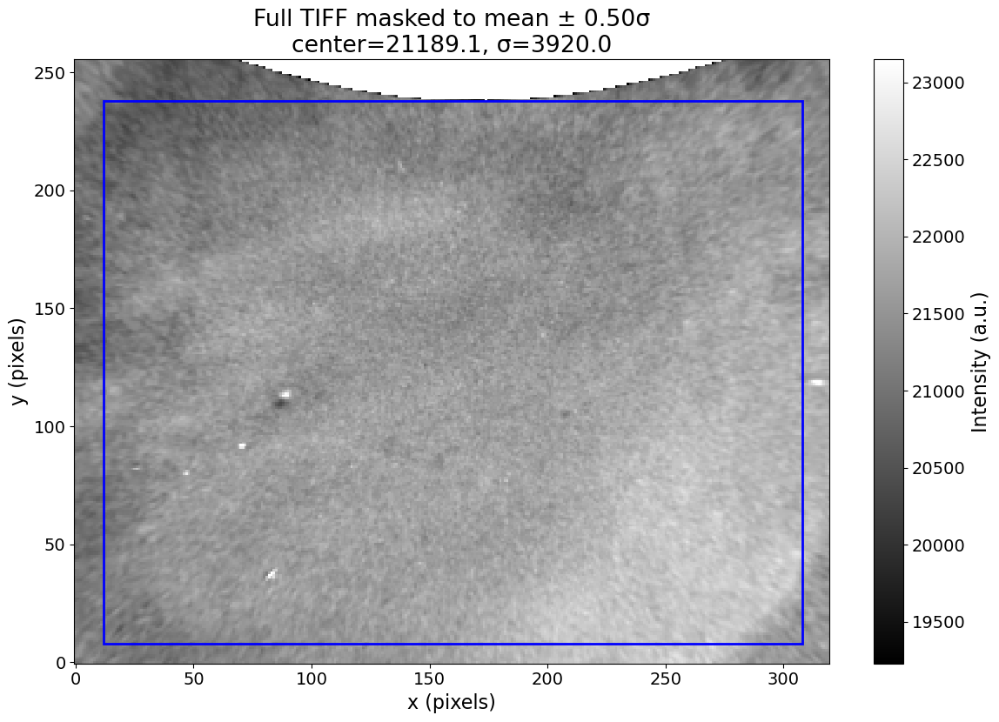

[ROI] shape: (230, 296)
[ROI] In-range count: 68073
[ROI] In-range min/max: 20272.00 / 23077.00
[ROI] In-range percentiles 5/50/95: 21031.00 / 21600.00 / 22251.00


C:\Users\domin\juwavelet\juwavelet\transform.py:324: RuntimeWarning: divide by zero encountered in divide
  wys = periods[:, np.newaxis] / (aspect * np.sin(thetas[np.newaxis, :]))
C:\Users\domin\juwavelet\juwavelet\transform.py:367: RuntimeWarning: divide by zero encountered in divide
  "wavelength_y": periods[:, np.newaxis] / (aspect * np.sin(thetas[np.newaxis, :])),


------------
cluster= 0
amplitude= 0.43826708365416395 idx= (np.int64(2), np.int64(10), np.int64(77), np.int64(125))
selected elements: 24315
------------
cluster= 1
amplitude= 0.41375680730961495 idx= (np.int64(4), np.int64(7), np.int64(76), np.int64(124))
selected elements: 1397
------------
cluster= 2
amplitude= 0.33847845329328485 idx= (np.int64(16), np.int64(7), np.int64(43), np.int64(95))
selected elements: 47243
------------
cluster= 3
amplitude= 0.325160285234059 idx= (np.int64(20), np.int64(7), np.int64(75), np.int64(59))
selected elements: 91011
------------
cluster= 4
amplitude= 0.31631428228578845 idx= (np.int64(8), np.int64(9), np.int64(29), np.int64(143))
selected elements: 8098
------------
cluster= 5
amplitude= 0.2925206786844921 idx= (np.int64(21), np.int64(6), np.int64(77), np.int64(138))
selected elements: 37967
------------
cluster= 6
amplitude= 0.2783944041016155 idx= (np.int64(24), np.int64(10), np.int64(120), np.int64(54))
selected elements: 72625
------------
cl

C:\Users\domin\juwavelet\juwavelet\utils.py:62: RuntimeWarning: divide by zero encountered in scalar divide
  hl = 1. / np.sin(theta[sel_t[j]])
100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 56.42it/s]
C:\Users\domin\juwavelet\juwavelet\utils.py:89: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


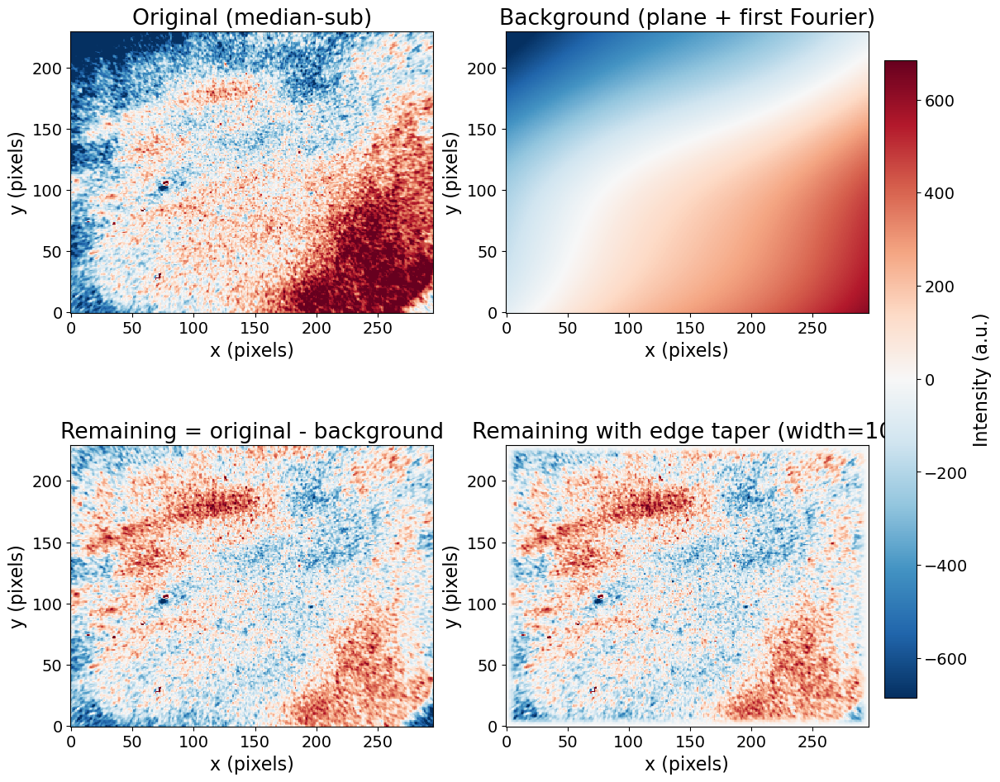

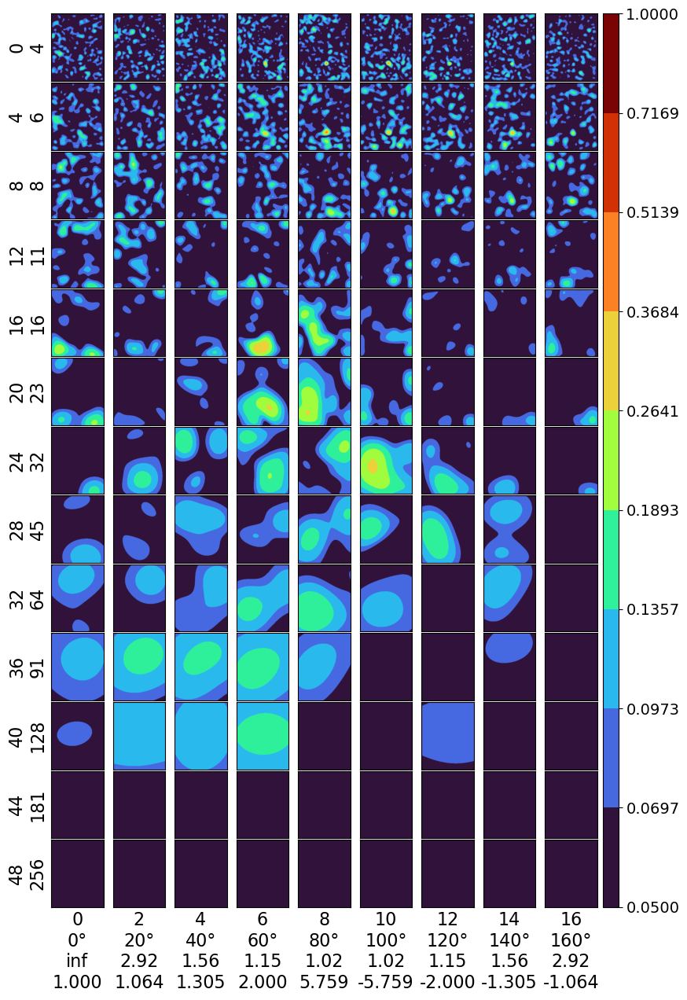

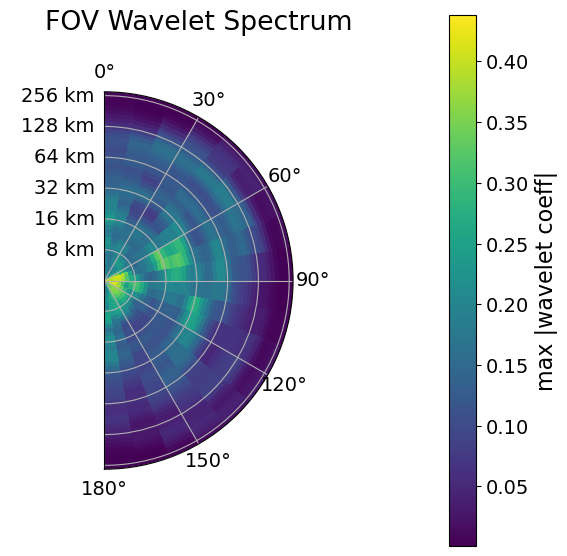

Cluster 0: amp=0.438, lamx=-27.39, lamy=4.83, lam=4.76
Cluster 1: amp=0.414, lamx=16.54, lamy=6.02, lam=5.66
Cluster 2: amp=0.338, lamx=46.78, lamy=17.03, lam=16.00
Cluster 3: amp=0.325, lamx=66.16, lamy=24.08, lam=22.63
Cluster 4: amp=0.316, lamx=130649914825562960.00, lamy=8.00, lam=8.00
Cluster 5: amp=0.293, lamx=49.35, lamy=28.49, lam=24.68
Cluster 6: amp=0.278, lamx=-184.28, lamy=32.49, lam=32.00
Cluster 7: amp=0.259, lamx=-9.24, lamy=16.00, lam=8.00
Cluster 8: amp=0.256, lamx=-9.66, lamy=54.79, lam=9.51


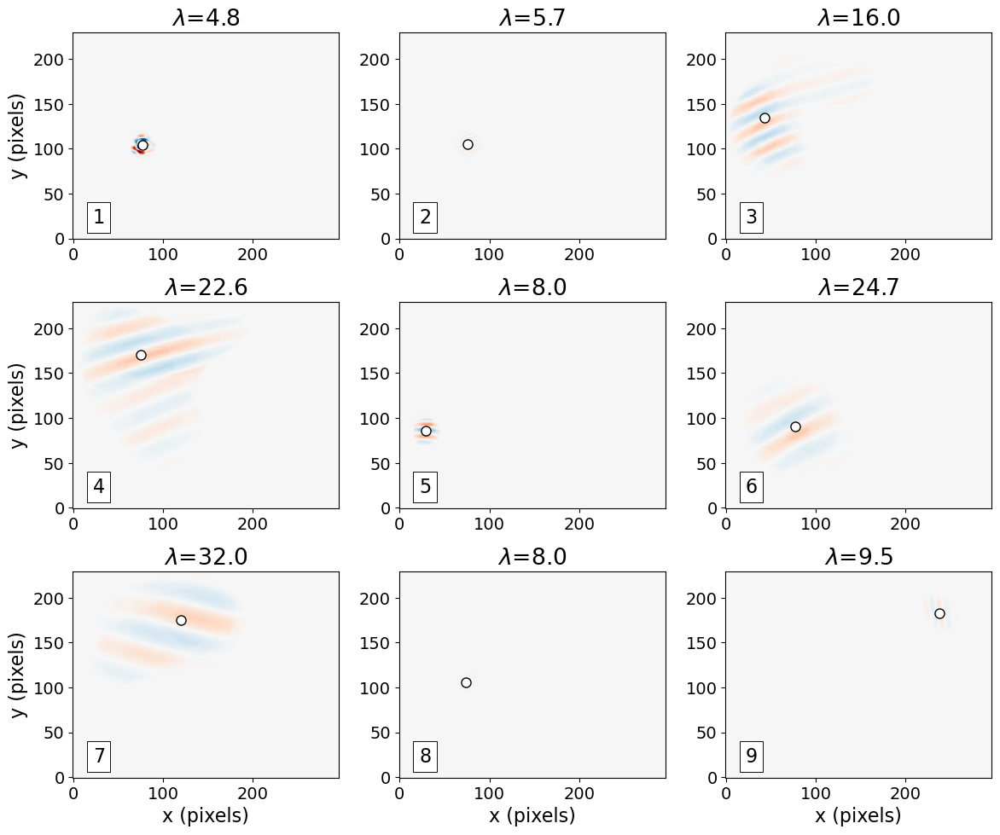

In [19]:
# Load a 16-bit TIFF, optionally mask values outside mean ± 0.5·sigma for stats/preview,
# fill masked values for CWT, run juwavelet 2D CWT, and plot:
#   - full-image masked/preview (mean ± 0.5 sigma) with ROI rectangle
#   - original (median-sub), background (plane + first Fourier), remaining, tapered-remaining
#   - preprocessed-for-CWT
#   - FOV wavelet spectrum
#   - 9 largest wave clusters

from __future__ import annotations
from typing import Tuple, Optional

import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import tifffile as tiff

from scipy.ndimage import median_filter
from juwavelet import transform, utils, plot_utils

# --------------------------
# User params
# --------------------------
TIFF_PATH = r"C:\Users\domin\juwavelet\examples\Waves For Anh\Nov7th1150\TempOH_caun1176.tif"

# ROI (pixel slices) for wavelet etc. Set to None to use full image.
X_SLICE: Optional[slice] = slice(12, 308)
Y_SLICE: Optional[slice] = slice(18, 248)

# Single sigma factor: mean ± 0.5σ (computed once on full image)
SIGMA_FACTOR = 0.5

# Use that same [mean ± 0.5σ] range as filter?
APPLY_RANGE_FILTER = True

# How to fill invalid pixels before CWT (to keep rectangular grid)
# choices: "median", "mean", "zero"
FILL_INVALID_FOR_CWT = "median"

# Preprocessing / background
REMOVE_TREND = True        # include 2D plane in "background"
STANDARDIZE = True         # z-score remaining field before CWT
GAUSS_BLUR_SIGMA = 1       # 0 disables, else e.g. 0.8

# Edge taper on remaining field (before CWT)
APPLY_TAPER = True
TAPER_EDGE_PIXELS = 10     # width of tapered region near each edge (in pixels)

# Wavelet params
S0 = 4
DJ = 1/8
JS = 50
JT = 18
ASPECT = 1

# Pixel spacing (km/pixel) for CWT (wavelengths will be in km)
DX = 0.623
DY = 0.623

# --------------------------
# Plot style
# --------------------------
matplotlib.rcParams.update({
    "axes.labelsize": 16,
    "font.size": 16,
    "xtick.labelsize": 14,
    "ytick.labelsize": 14,
    "legend.fontsize": 14,
    "figure.figsize": [2 * 6.94, 2 * 4.29],
})

# --------------------------
# Helpers
# --------------------------
def load_tiff_window(
    path: str,
    xsl: Optional[slice],
    ysl: Optional[slice],
) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
    """
    Return (x_coords, y_coords, window) where window is float32 with shape (ny, nx).

    If xsl or ysl is None, the full range is used.
    """
    img = tiff.imread(path)
    if img.ndim == 3 and img.shape[-1] == 1:
        img = img[..., 0]
    if img.ndim != 2:
        raise ValueError(f"Expected single-frame 2D TIFF; got shape {img.shape}")

    Z = np.asarray(img, dtype=np.float32)

    if ysl is None:
        ysl = slice(None, None)
    if xsl is None:
        xsl = slice(None, None)
    win = Z[ysl, xsl]

    ny, nx = win.shape
    x = np.arange(nx, dtype=float)
    y = np.arange(ny, dtype=float)

    # Clean improbable NaNs/Infs
    med = float(np.median(win))
    win = np.nan_to_num(win, nan=med, posinf=med, neginf=med).astype(np.float32, copy=False)
    return x, y, win


def make_range_mask(Z: np.ndarray, lo: float, hi: float) -> np.ndarray:
    """True where value is inside [lo, hi]."""
    return (Z >= lo) & (Z <= hi)


def fit_plane(Z: np.ndarray) -> np.ndarray:
    """
    Fit a 2D plane ax + by + c to Z (least squares) and return the plane.
    """
    ny, nx = Z.shape
    yy, xx = np.mgrid[0:ny, 0:nx]
    G = np.stack([xx.ravel(), yy.ravel(), np.ones(nx * ny)], axis=1)
    coeff, *_ = np.linalg.lstsq(G, Z.ravel(), rcond=None)
    plane = (coeff[0] * xx + coeff[1] * yy + coeff[2])
    return plane


def extract_first_fourier_bg(Z: np.ndarray) -> Tuple[np.ndarray, np.ndarray]:
    """
    From a 2D field Z, keep only the first Fourier components in x and y:

      - fundamental in x: kx = ±1, ky = 0
      - fundamental in y: ky = ±1, kx = 0

    Returns (background_from_fft, residual).
    """
    ny, nx = Z.shape
    F = np.fft.fft2(Z)
    F_bg = np.zeros_like(F, dtype=complex)

    # fundamental in x (along columns, ky = 0)
    if nx > 1:
        F_bg[0, 1] = F[0, 1]
        F_bg[0, -1] = F[0, -1]

    # fundamental in y (along rows, kx = 0)
    if ny > 1:
        F_bg[1, 0] = F[1, 0]
        F_bg[-1, 0] = F[-1, 0]

    bg = np.fft.ifft2(F_bg).real
    resid = Z - bg
    return bg, resid


def maybe_blur(Z: np.ndarray, sigma: float) -> np.ndarray:
    if sigma <= 0:
        return Z
    try:
        from scipy.ndimage import gaussian_filter
    except Exception:
        return Z
    return gaussian_filter(Z, sigma=float(sigma))


def fill_invalid(Z: np.ndarray, valid_mask: np.ndarray, how: str) -> np.ndarray:
    """Fill invalid pixels to keep rectangular grid before CWT."""
    out = Z.copy()
    if valid_mask is None:
        return out
    inv = ~valid_mask
    if not np.any(inv):
        return out
    if how == "median":
        val = float(np.median(out[~inv])) if np.any(~inv) else float(np.median(out))
    elif how == "mean":
        val = float(np.mean(out[~inv])) if np.any(~inv) else float(np.mean(out))
    elif how == "zero":
        val = 0.0
    else:
        raise ValueError("FILL_INVALID_FOR_CWT must be 'median', 'mean', or 'zero'")
    out[inv] = val
    return out


def _fmt(v: float) -> str:
    if not np.isfinite(v):
        return "∞"
    v = float(v)
    if abs(v) >= 1000 or abs(v) < 0.1:
        return f"{v:.2e}"
    elif abs(v) >= 100:
        return f"{v:.0f}"
    else:
        return f"{v:.1f}"


# --------------------------
# Edge taper (Hanning near boundaries)
# --------------------------
def _hanning_edge_1d(n: int, edge: int) -> np.ndarray:
    """
    1D window that is ~0 at the very edges, ramps to 1 over `edge` pixels,
    and equals 1 in the interior. Hanning-like cosine ramp.
    """
    w = np.ones(n, dtype=float)
    if edge <= 0:
        return w
    edge = min(edge, n // 2)
    # cosine ramp from 0 to 1
    ramp = 0.5 * (1.0 - np.cos(np.linspace(0, np.pi, edge, endpoint=True)))
    w[:edge] = ramp
    w[-edge:] = ramp[::-1]
    return w


def apply_edge_hanning_taper(Z: np.ndarray, edge: int) -> np.ndarray:
    """
    Apply a separable 2D Hanning-like taper only near the edges:
      interior stays ~1
      transitions smoothly to 0 at the borders over `edge` pixels.
    """
    ny, nx = Z.shape
    if edge <= 0:
        return Z
    wx = _hanning_edge_1d(nx, edge)
    wy = _hanning_edge_1d(ny, edge)
    W = np.outer(wy, wx)   # shape (ny, nx)
    return Z * W


# --------------------------
# Pipeline
# --------------------------
def run_pipeline():
    # 1) Load full TIFF (no spatial slice here)
    x_full, y_full, full = load_tiff_window(TIFF_PATH, None, None)
    ny_full, nx_full = full.shape

    # 2) Compute mean/std once on the full image, use ±0.5σ everywhere
    sample_full = full.ravel().astype(float)
    center = float(np.mean(sample_full))
    sigma = float(np.std(sample_full))
    k = SIGMA_FACTOR
    lo = center - k * sigma
    hi = center + k * sigma

    print(f"[Full] mean: {center:.2f}")
    print(f"[Full] sigma: {sigma:.2f}")
    print(f"[Full] Dynamic range: [{lo:.2f}, {hi:.2f}] = mean ± {k:.2f}·sigma")

    # 3) Full-image preview with that same range, and ROI rectangle
    mask_full = make_range_mask(full, lo, hi)
    preview = full.copy().astype(float)
    preview[~mask_full] = np.nan

    vals_full = preview[np.isfinite(preview)]
    if vals_full.size > 0:
        print(f"[Full] In-range count: {vals_full.size}")
        print(f"[Full] In-range min/max: {np.nanmin(vals_full):.2f} / {np.nanmax(vals_full):.2f}")
        p5f, p50f, p95f = np.nanpercentile(vals_full, [5, 50, 95])
        print(f"[Full] In-range percentiles 5/50/95: {p5f:.2f} / {p50f:.2f} / {p95f:.2f}")
    else:
        print("[Full] Warning: no pixels within mean ± 0.5 sigma")

    disp_prev = np.clip(preview, lo, hi)

    # Coordinates for plotting (flip y)
    x_coords = np.arange(nx_full, dtype=float)
    y_coords = np.arange(ny_full, dtype=float)[::-1]

    fig_prev, ax_prev = plt.subplots()
    im_prev = ax_prev.pcolormesh(
        x_coords,
        y_coords,
        disp_prev,
        shading="auto",
        cmap="gray",
        vmin=lo,
        vmax=hi,
    )
    cb_prev = fig_prev.colorbar(im_prev, ax=ax_prev, fraction=0.046, pad=0.04)
    cb_prev.set_label("Intensity (a.u.)")
    ax_prev.set_xlabel("x (pixels)")
    ax_prev.set_ylabel("y (pixels)")
    ax_prev.set_title(f"Full TIFF masked to mean ± {k:.2f}σ\ncenter={center:.1f}, σ={sigma:.1f}")
    ax_prev.set_aspect("equal", adjustable="box")

    # ROI rectangle in full-image coordinates
    ysl_full = Y_SLICE if Y_SLICE is not None else slice(0, ny_full)
    xsl_full = X_SLICE if X_SLICE is not None else slice(0, nx_full)

    x0 = 0 if xsl_full.start is None else xsl_full.start
    x1 = nx_full if xsl_full.stop is None else xsl_full.stop
    y0 = 0 if ysl_full.start is None else ysl_full.start
    y1 = ny_full if ysl_full.stop is None else ysl_full.stop

    # Map to flipped-y display coords
    # original row range [y0, y1) -> [ny_full - y1, ny_full - y0)
    y0_disp = ny_full - y1
    y1_disp = ny_full - y0

    rect = patches.Rectangle(
        (x0, y0_disp),
        x1 - x0,
        y1_disp - y0_disp,
        linewidth=2,
        edgecolor="blue",
        facecolor="none",
    )
    ax_prev.add_patch(rect)

    plt.tight_layout()
    plt.show(fig_prev)

    # 4) Now define ROI for everything else (using same lo/hi)
    ysl = Y_SLICE if Y_SLICE is not None else slice(None, None)
    xsl = X_SLICE if X_SLICE is not None else slice(None, None)

    raw = full[ysl, xsl]
    ny, nx = raw.shape
    x1d = np.arange(nx, dtype=float)
    y1d = np.arange(ny, dtype=float)[::-1]   # flip y for display

    print(f"[ROI] shape: {raw.shape}")

    # 5) Range filter for ROI, using the SAME [lo, hi] from full image
    mask = None
    if APPLY_RANGE_FILTER:
        mask = make_range_mask(raw, lo, hi)
        vals_roi = raw[mask]
        if vals_roi.size > 0:
            print(f"[ROI] In-range count: {vals_roi.size}")
            print(f"[ROI] In-range min/max: {np.nanmin(vals_roi):.2f} / {np.nanmax(vals_roi):.2f}")
            p5r, p50r, p95r = np.nanpercentile(vals_roi, [5, 50, 95])
            print(f"[ROI] In-range percentiles 5/50/95: {p5r:.2f} / {p50r:.2f} / {p95r:.2f}")
        else:
            print("[ROI] Warning: no pixels in [mean ± 0.5σ]")

    # 6) Prepare data for CWT: fill removed pixels to keep rectangular grid
    filled = fill_invalid(raw, mask, FILL_INVALID_FOR_CWT) if APPLY_RANGE_FILTER else raw

    # 7) Background separation: plane + first Fourier
    proc0 = filled.copy()
    if REMOVE_TREND:
        plane = fit_plane(proc0)
        detrended = proc0 - plane
    else:
        plane = np.zeros_like(proc0)
        detrended = proc0

    fourier_bg, _ = extract_first_fourier_bg(detrended)
    background = plane + fourier_bg
    remaining = proc0 - background

    # 8) Apply edge taper on remaining field (for CWT and plotting)
    if APPLY_TAPER:
        remaining_tapered = apply_edge_hanning_taper(remaining, TAPER_EDGE_PIXELS)
    else:
        remaining_tapered = remaining.copy()

    # Compute global vmin/vmax for original / background / remaining / tapered-remaining
    med = np.nanmedian(proc0)
    orig_c = proc0 - med
    bg_c = background - med
    rem_c = remaining
    rem_tapered_c = remaining_tapered

    stacked = np.concatenate([
        orig_c.ravel(),
        bg_c.ravel(),
        rem_c.ravel(),
        rem_tapered_c.ravel(),
    ])

    p_low, p_high = np.nanpercentile(stacked, [1, 99])
    vmax = max(abs(p_low), abs(p_high))
    if vmax == 0 or not np.isfinite(vmax):
        vmax = 1.0
    vmin = -vmax

    # 9) 4-panel background figure: original / background / remaining / tapered-remaining
    fig_bg, axs_bg = plt.subplots(2, 2, figsize=(12, 10),
                                  constrained_layout=True)
    axes_bg_flat = axs_bg.flatten()

    imgs_bg = [
        (orig_c, "Original (median-sub)"),
        (bg_c, "Background (plane + first Fourier)"),
        (rem_c, "Remaining = original - background"),
        (rem_tapered_c, f"Remaining with edge taper (width={TAPER_EDGE_PIXELS})"),
    ]

    im_bg = None
    for ax, (Z, title) in zip(axes_bg_flat, imgs_bg):
        im_bg = ax.pcolormesh(
            x1d,
            y1d,
            Z,
            shading="auto",
            cmap="RdBu_r",
            vmin=vmin,
            vmax=vmax,
        )
        ax.set_title(title)
        ax.set_xlabel("x (pixels)")
        ax.set_ylabel("y (pixels)")
        ax.set_aspect("equal")

    cbar_bg = fig_bg.colorbar(im_bg, ax=axs_bg, orientation="vertical",
                              fraction=0.04, pad=0.02)
    cbar_bg.set_label("Intensity (a.u.)")

    # 10) Continue preprocessing on the tapered remaining field (for CWT only)
    proc = remaining_tapered.copy()
    if STANDARDIZE:
        m = np.median(proc)
        s = np.std(proc)
        # original note: median already subtracted earlier; keep your choice:
        proc = proc / s if s > 0 else proc
    proc = maybe_blur(proc, GAUSS_BLUR_SIGMA)

    # juwavelet expects (nx, ny); image is (ny, nx)
    wave_xy = proc.T

    cwt = transform.decompose2d(
        wave_xy, dx=DX, dy=DY, s0=S0, dj=DJ, js=JS, jt=JT, aspect=ASPECT
    )

    # 11) Identify clusters
    amps, idxs, iwave = utils.identify_cluster2d(cwt, min_amp=0.25, thr=0.2)

    decomposition = cwt["decomposition"]
    orig = decomposition.copy()

    # 12) Overview CWT plot
    cmap = matplotlib.cm.turbo
    norm = matplotlib.colors.BoundaryNorm(
        np.exp(np.linspace(np.log(0.05), np.log(1.0), 10)), cmap.N
    )
    fig1, _ = utils.plot_decomposition2d(cwt, redux_s=4, redux_t=2, cmap=cmap, norm=norm)

    # 13) FOV wavelet spectrum
    plot_utils.plot_fov_wavelet_spectrum(cwt, stat="max")

    # 14) Component panels: 9 largest clusters
    fig2, axs = plt.subplots(3, 3, figsize=(12, 10))
    axes_flat = axs.flatten()

    opts_img = {"cmap": "RdBu_r", "vmin": -.8, "vmax": .8, "rasterized": True}

    n_clusters = len(amps) if amps is not None else 0

    if n_clusters == 0:
        for ax in axes_flat:
            ax.set_title("no clusters found")
            ax.axis("off")
    else:
        order = np.argsort(amps)[::-1]
        n_show = min(9, n_clusters)
        biggest = order[:n_show]

        for ax, kcl in zip(axes_flat, biggest):
            # Reconstruct this cluster only
            decomposition[:] = orig
            decomposition[iwave != kcl] = 0
            rec = transform.reconstruct2d(cwt)  # (nx, ny)

            rec_centered = rec.T - np.median(rec)

            udx = idxs[kcl]          # (s_idx, t_idx, ...)
            s_idx = int(udx[0])
            t_idx = int(udx[1])

            lamx = cwt["wavelength_x"][s_idx, t_idx]
            lamy = cwt["wavelength_y"][s_idx, t_idx]

            inv2 = 0.0
            if np.isfinite(lamx) and lamx != 0:
                inv2 += (1.0 / lamx) ** 2
            if np.isfinite(lamy) and lamy != 0:
                inv2 += (1.0 / lamy) ** 2
            lam = np.inf if inv2 == 0 else 1.0 / np.sqrt(inv2)

            ax.set_title(rf"$\lambda$={_fmt(lam)}")
            ax.pcolormesh(x1d, y1d, rec_centered, **opts_img)

            # Mark peak location
            decomposition[:] = np.abs(decomposition)
            max_idx = np.unravel_index(
                decomposition[s_idx, t_idx].argmax(), decomposition[0, 0].shape
            )
            ax.plot(
                x1d[max_idx[0]],
                y1d[max_idx[1]],
                "o", color="w", mec="k", ms=8,
            )

            ax.set_aspect("equal", adjustable="box")

            print(
                f"Cluster {kcl}: amp={amps[kcl]:.3f}, "
                f"lamx={lamx:.2f}, lamy={lamy:.2f}, "
                f"lam={'inf' if not np.isfinite(lam) else f'{lam:.2f}'}"
            )

        # If fewer than 9 clusters, hide the remaining axes
        for ax in axes_flat[n_show:]:
            ax.set_title("no cluster")
            ax.axis("off")

    # Axis labels (pixels)
    for ax in axs[2, :]:
        ax.set_xlabel("x (pixels)")
    for ax in axs[:, 0]:
        ax.set_ylabel("y (pixels)")

    # Number tags (1–9)
    number_box = {
        "boxstyle": "square",
        "lw": 0.67,
        "facecolor": "white",
        "edgecolor": "black",
    }
    for i, ax in enumerate(axes_flat, start=1):
        ax.text(
            0.12,
            0.15,
            str(i),
            transform=ax.transAxes,
            bbox=number_box,
            va="top",
            ha="right",
        )

    fig2.tight_layout()

    # Show all
    plt.show(fig_bg)
    plt.show(fig1)
    plt.show(fig2)


# --------------------------
# Run
# --------------------------
if __name__ == "__main__":
    run_pipeline()


[Full] mean: 21189.07
[Full] sigma: 3920.02
[Full] Dynamic range: [19229.06, 23149.08] = mean ± 0.50·sigma
[ROI] shape: (182, 290)
[ROI] In-range count: 52776
[ROI] In-range min/max: 20272.00 / 23077.00
[ROI] In-range percentiles 5/50/95: 20981.75 / 21561.00 / 22089.00


C:\Users\domin\juwavelet\juwavelet\transform.py:324: RuntimeWarning: divide by zero encountered in divide
  wys = periods[:, np.newaxis] / (aspect * np.sin(thetas[np.newaxis, :]))
C:\Users\domin\juwavelet\juwavelet\transform.py:367: RuntimeWarning: divide by zero encountered in divide
  "wavelength_y": periods[:, np.newaxis] / (aspect * np.sin(thetas[np.newaxis, :])),


------------
cluster= 0
amplitude= 0.4598251691303413 idx= (np.int64(2), np.int64(10), np.int64(77), np.int64(125))
selected elements: 27965
------------
cluster= 1
amplitude= 0.4345767731981781 idx= (np.int64(4), np.int64(7), np.int64(76), np.int64(124))
selected elements: 1498
------------
cluster= 2
amplitude= 0.35650345810527095 idx= (np.int64(16), np.int64(7), np.int64(43), np.int64(95))
selected elements: 65771
------------
cluster= 3
amplitude= 0.34264325108730564 idx= (np.int64(20), np.int64(7), np.int64(73), np.int64(59))
selected elements: 90951
------------
cluster= 4
amplitude= 0.333378259636519 idx= (np.int64(8), np.int64(9), np.int64(29), np.int64(143))
selected elements: 10518
------------
cluster= 5
amplitude= 0.2983527858996557 idx= (np.int64(24), np.int64(10), np.int64(121), np.int64(51))
selected elements: 100361
------------
cluster= 6
amplitude= 0.285342903554948 idx= (np.int64(21), np.int64(6), np.int64(77), np.int64(131))
selected elements: 27613
------------
clu

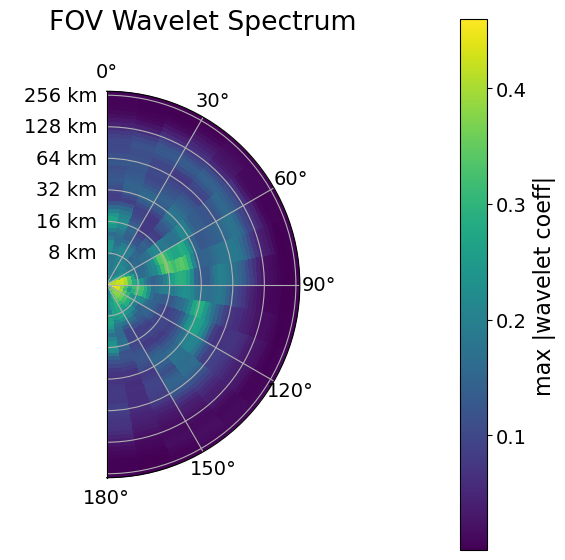

Cluster 0: amp=0.460, lamx=-27.39, lamy=4.83, lam=4.76
Cluster 1: amp=0.435, lamx=16.54, lamy=6.02, lam=5.66
Cluster 2: amp=0.357, lamx=46.78, lamy=17.03, lam=16.00
Cluster 3: amp=0.343, lamx=66.16, lamy=24.08, lam=22.63
Cluster 4: amp=0.333, lamx=130649914825562960.00, lamy=8.00, lam=8.00
Cluster 5: amp=0.298, lamx=-184.28, lamy=32.49, lam=32.00
Cluster 6: amp=0.285, lamx=49.35, lamy=28.49, lam=24.68
Cluster 7: amp=0.283, lamx=38.05, lamy=21.97, lam=19.03
Cluster 8: amp=0.272, lamx=-9.24, lamy=16.00, lam=8.00


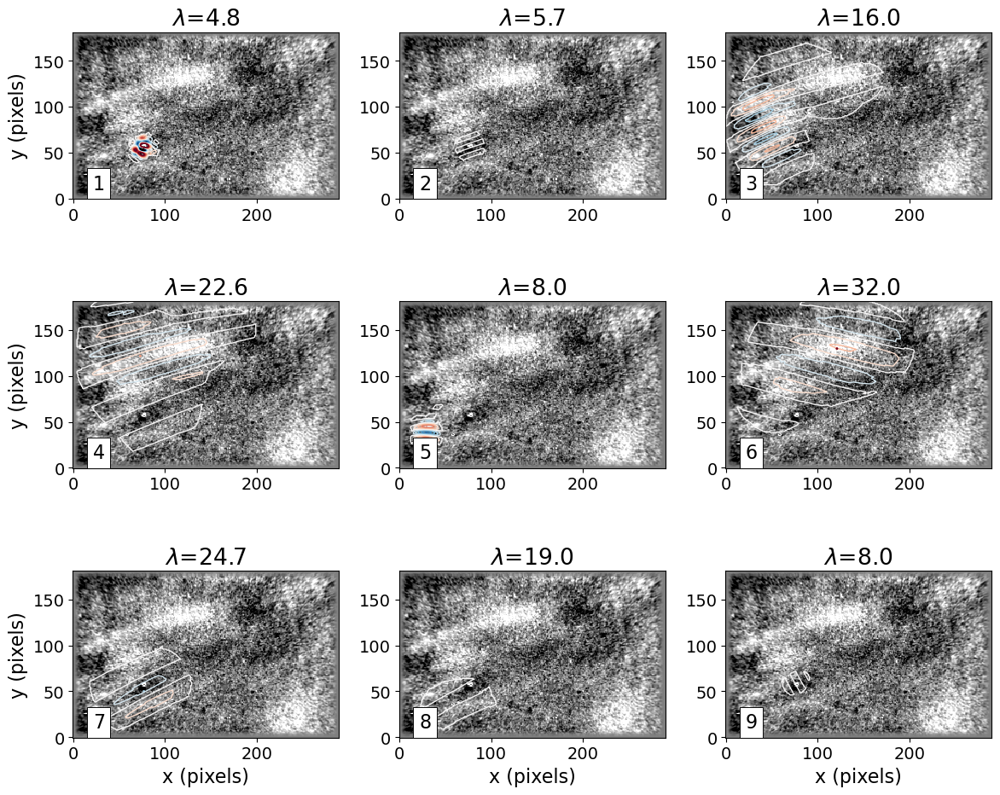

In [12]:
# Overlay top 9 wavelet clusters on the tapered remaining field
#
# Pipeline:
#   - Load TIFF
#   - Use global mean ± 0.5 sigma as filter range
#   - Clip to ROI
#   - Background = plane + first Fourier components
#   - Remaining -> edge taper -> CWT
#   - Identify clusters
#   - Plot 3x3:
#       background image = tapered remaining field
#       overlay = contours of reconstructed cluster

from __future__ import annotations
from typing import Tuple, Optional

import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import tifffile as tiff

from juwavelet import transform, utils, plot_utils

# --------------------------
# User params
# --------------------------
TIFF_PATH = r"C:\Users\domin\juwavelet\examples\Waves For Anh\Nov7th1150\TempOH_caun1176.tif"

# ROI (pixel slices) for wavelet etc. Set to None to use full image.
X_SLICE: Optional[slice] = slice(12, 302)
Y_SLICE: Optional[slice] = slice(18, 200)

# Single sigma factor: mean ± 0.5σ (computed once on full image)
SIGMA_FACTOR = 0.5
APPLY_RANGE_FILTER = True

# How to fill invalid pixels before CWT (to keep rectangular grid)
# choices: "median", "mean", "zero"
FILL_INVALID_FOR_CWT = "median"

# Preprocessing / background
REMOVE_TREND = True
STANDARDIZE = True
GAUSS_BLUR_SIGMA = 1    # 0 disables, else e.g. 0.8

# Edge taper on remaining field (before CWT)
APPLY_TAPER = True
TAPER_EDGE_PIXELS = 10

# Wavelet params
S0 = 4
DJ = 1/8
JS = 50
JT = 18
ASPECT = 1

# Pixel spacing (km/pixel) for CWT (wavelengths will be in km)
DX = 0.623
DY = 0.623

# --------------------------
# Plot style
# --------------------------
matplotlib.rcParams.update({
    "axes.labelsize": 16,
    "font.size": 16,
    "xtick.labelsize": 14,
    "ytick.labelsize": 14,
    "legend.fontsize": 14,
    "figure.figsize": [2 * 6.94, 2 * 4.29],
})

# --------------------------
# Helpers
# --------------------------
def load_tiff_window(
    path: str,
    xsl: Optional[slice],
    ysl: Optional[slice],
) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
    """
    Return (x_coords, y_coords, window) where window is float32 with shape (ny, nx).

    If xsl or ysl is None, the full range is used.
    """
    img = tiff.imread(path)
    if img.ndim == 3 and img.shape[-1] == 1:
        img = img[..., 0]
    if img.ndim != 2:
        raise ValueError(f"Expected single-frame 2D TIFF; got shape {img.shape}")

    Z = np.asarray(img, dtype=np.float32)

    if ysl is None:
        ysl = slice(None, None)
    if xsl is None:
        xsl = slice(None, None)
    win = Z[ysl, xsl]

    ny, nx = win.shape
    x = np.arange(nx, dtype=float)
    y = np.arange(ny, dtype=float)

    # Clean improbable NaNs/Infs
    med = float(np.median(win))
    win = np.nan_to_num(win, nan=med, posinf=med, neginf=med).astype(np.float32, copy=False)
    return x, y, win


def make_range_mask(Z: np.ndarray, lo: float, hi: float) -> np.ndarray:
    """True where value is inside [lo, hi]."""
    return (Z >= lo) & (Z <= hi)


def fit_plane(Z: np.ndarray) -> np.ndarray:
    """
    Fit a 2D plane ax + by + c to Z (least squares) and return the plane.
    """
    ny, nx = Z.shape
    yy, xx = np.mgrid[0:ny, 0:nx]
    G = np.stack([xx.ravel(), yy.ravel(), np.ones(nx * ny)], axis=1)
    coeff, *_ = np.linalg.lstsq(G, Z.ravel(), rcond=None)
    plane = (coeff[0] * xx + coeff[1] * yy + coeff[2])
    return plane


def extract_first_fourier_bg(Z: np.ndarray) -> Tuple[np.ndarray, np.ndarray]:
    """
    From a 2D field Z, keep only the first Fourier components in x and y:

      - fundamental in x: kx = ±1, ky = 0
      - fundamental in y: ky = ±1, kx = 0

    Returns (background_from_fft, residual).
    """
    ny, nx = Z.shape
    F = np.fft.fft2(Z)
    F_bg = np.zeros_like(F, dtype=complex)

    # fundamental in x (along columns, ky = 0)
    if nx > 1:
        F_bg[0, 1] = F[0, 1]
        F_bg[0, -1] = F[0, -1]

    # fundamental in y (along rows, kx = 0)
    if ny > 1:
        F_bg[1, 0] = F[1, 0]
        F_bg[-1, 0] = F[-1, 0]

    bg = np.fft.ifft2(F_bg).real
    resid = Z - bg
    return bg, resid


def maybe_blur(Z: np.ndarray, sigma: float) -> np.ndarray:
    if sigma <= 0:
        return Z
    try:
        from scipy.ndimage import gaussian_filter
    except Exception:
        return Z
    return gaussian_filter(Z, sigma=float(sigma))


def fill_invalid(Z: np.ndarray, valid_mask: np.ndarray, how: str) -> np.ndarray:
    """Fill invalid pixels to keep rectangular grid before CWT."""
    out = Z.copy()
    if valid_mask is None:
        return out
    inv = ~valid_mask
    if not np.any(inv):
        return out
    if how == "median":
        val = float(np.median(out[~inv])) if np.any(~inv) else float(np.median(out))
    elif how == "mean":
        val = float(np.mean(out[~inv])) if np.any(~inv) else float(np.mean(out))
    elif how == "zero":
        val = 0.0
    else:
        raise ValueError("FILL_INVALID_FOR_CWT must be 'median', 'mean', or 'zero'")
    out[inv] = val
    return out


def _fmt(v: float) -> str:
    if not np.isfinite(v):
        return "∞"
    v = float(v)
    if abs(v) >= 1000 or abs(v) < 0.1:
        return f"{v:.2e}"
    elif abs(v) >= 100:
        return f"{v:.0f}"
    else:
        return f"{v:.1f}"


# --------------------------
# Edge taper (Hanning near boundaries)
# --------------------------
def _hanning_edge_1d(n: int, edge: int) -> np.ndarray:
    """
    1D window that is ~0 at the very edges, ramps to 1 over `edge` pixels,
    and equals 1 in the interior. Hanning-like cosine ramp.
    """
    w = np.ones(n, dtype=float)
    if edge <= 0:
        return w
    edge = min(edge, n // 2)
    ramp = 0.5 * (1.0 - np.cos(np.linspace(0, np.pi, edge, endpoint=True)))
    w[:edge] = ramp
    w[-edge:] = ramp[::-1]
    return w


def apply_edge_hanning_taper(Z: np.ndarray, edge: int) -> np.ndarray:
    """
    Apply a separable 2D Hanning-like taper only near the edges:
      interior stays ~1
      transitions smoothly to 0 at the borders over `edge` pixels.
    """
    ny, nx = Z.shape
    if edge <= 0:
        return Z
    wx = _hanning_edge_1d(nx, edge)
    wy = _hanning_edge_1d(ny, edge)
    W = np.outer(wy, wx)   # shape (ny, nx)
    return Z * W


# --------------------------
# Pipeline
# --------------------------
def run_pipeline():
    # 1) Load full TIFF (no spatial slice here)
    x_full, y_full, full = load_tiff_window(TIFF_PATH, None, None)
    ny_full, nx_full = full.shape

    # 2) Compute mean/std once on the full image, use ±0.5σ everywhere
    sample_full = full.ravel().astype(float)
    center = float(np.mean(sample_full))
    sigma = float(np.std(sample_full))
    k = SIGMA_FACTOR
    lo = center - k * sigma
    hi = center + k * sigma

    print(f"[Full] mean: {center:.2f}")
    print(f"[Full] sigma: {sigma:.2f}")
    print(f"[Full] Dynamic range: [{lo:.2f}, {hi:.2f}] = mean ± {k:.2f}·sigma")

    # 3) Now define ROI for everything else (using same lo/hi)
    ysl = Y_SLICE if Y_SLICE is not None else slice(None, None)
    xsl = X_SLICE if X_SLICE is not None else slice(None, None)

    raw = full[ysl, xsl]
    ny, nx = raw.shape
    x1d = np.arange(nx, dtype=float)
    y1d = np.arange(ny, dtype=float)[::-1]   # flip y for display

    print(f"[ROI] shape: {raw.shape}")

    # 4) Range filter for ROI, using the SAME [lo, hi] from full image
    mask = None
    if APPLY_RANGE_FILTER:
        mask = make_range_mask(raw, lo, hi)
        vals_roi = raw[mask]
        if vals_roi.size > 0:
            print(f"[ROI] In-range count: {vals_roi.size}")
            print(f"[ROI] In-range min/max: {np.nanmin(vals_roi):.2f} / {np.nanmax(vals_roi):.2f}")
            p5r, p50r, p95r = np.nanpercentile(vals_roi, [5, 50, 95])
            print(f"[ROI] In-range percentiles 5/50/95: {p5r:.2f} / {p50r:.2f} / {p95r:.2f}")
        else:
            print("[ROI] Warning: no pixels in [mean ± 0.5σ]")

    # 5) Prepare data for CWT: fill removed pixels to keep rectangular grid
    filled = fill_invalid(raw, mask, FILL_INVALID_FOR_CWT) if APPLY_RANGE_FILTER else raw

    # 6) Background separation: plane + first Fourier
    proc0 = filled.copy()
    if REMOVE_TREND:
        plane = fit_plane(proc0)
        detrended = proc0 - plane
    else:
        plane = np.zeros_like(proc0)
        detrended = proc0

    fourier_bg, _ = extract_first_fourier_bg(detrended)
    background = plane + fourier_bg
    remaining = proc0 - background

    # 7) Apply edge taper on remaining field (for CWT and plotting)
    if APPLY_TAPER:
        remaining_tapered = apply_edge_hanning_taper(remaining, TAPER_EDGE_PIXELS)
    else:
        remaining_tapered = remaining.copy()

    # Save a centered version of tapered field for plotting as background
    rem_tapered_c = remaining_tapered - np.median(remaining_tapered)

    # Base scaling for grayscale background
    base_low, base_high = np.nanpercentile(rem_tapered_c, [2, 98])
    base_vmax = max(abs(base_low), abs(base_high))
    if not np.isfinite(base_vmax) or base_vmax == 0:
        base_vmax = 1.0
    base_vmin = -base_vmax

    # 8) Preprocess for CWT only (standardize + blur)
    proc = remaining_tapered.copy()
    if STANDARDIZE:
        s = np.std(proc)
        proc = proc / s if s > 0 else proc
    proc = maybe_blur(proc, GAUSS_BLUR_SIGMA)

    # juwavelet expects (nx, ny); image is (ny, nx)
    wave_xy = proc.T

    cwt = transform.decompose2d(
        wave_xy, dx=DX, dy=DY, s0=S0, dj=DJ, js=JS, jt=JT, aspect=ASPECT
    )

    # 9) Identify clusters
    amps, idxs, iwave = utils.identify_cluster2d(cwt, min_amp=0.25, thr=0.2)

    decomposition = cwt["decomposition"]
    orig = decomposition.copy()

    # Optional: FOV wavelet spectrum just to inspect
    plot_utils.plot_fov_wavelet_spectrum(cwt, stat="max")

    # 10) Overlay clusters on tapered field
    fig2, axs = plt.subplots(3, 3, figsize=(12, 10))
    axes_flat = axs.flatten()

    n_clusters = len(amps) if amps is not None else 0

    if n_clusters == 0:
        for ax in axes_flat:
            ax.set_title("no clusters found")
            ax.axis("off")
    else:
        order = np.argsort(amps)[::-1]
        n_show = min(9, n_clusters)
        biggest = order[:n_show]

        # Levels for contours (symmetric)
        contour_levels = np.linspace(-0.6, 0.6, 13)

        for ax, kcl in zip(axes_flat, biggest):
            # Background: tapered remaining field (centered), grayscale
            bg = ax.pcolormesh(
                x1d,
                y1d,
                rem_tapered_c,
                shading="auto",
                cmap="gray",
                vmin=base_vmin,
                vmax=base_vmax,
            )

            # Reconstruct this cluster only
            decomposition[:] = orig
            decomposition[iwave != kcl] = 0
            rec = transform.reconstruct2d(cwt)  # (nx, ny)
            rec_centered = rec.T - np.median(rec)

            udx = idxs[kcl]          # (s_idx, t_idx, ...)
            s_idx = int(udx[0])
            t_idx = int(udx[1])

            lamx = cwt["wavelength_x"][s_idx, t_idx]
            lamy = cwt["wavelength_y"][s_idx, t_idx]

            inv2 = 0.0
            if np.isfinite(lamx) and lamx != 0:
                inv2 += (1.0 / lamx) ** 2
            if np.isfinite(lamy) and lamy != 0:
                inv2 += (1.0 / lamy) ** 2
            lam = np.inf if inv2 == 0 else 1.0 / np.sqrt(inv2)

            # Overlay contours of reconstructed cluster
            cs = ax.contour(
                x1d,
                y1d,
                rec_centered,
                levels=contour_levels,
                cmap="RdBu_r",
                linewidths=1,
            )

            ax.set_title(rf"$\lambda$={_fmt(lam)}")
            ax.set_aspect("equal", adjustable="box")

            print(
                f"Cluster {kcl}: amp={amps[kcl]:.3f}, "
                f"lamx={lamx:.2f}, lamy={lamy:.2f}, "
                f"lam={'inf' if not np.isfinite(lam) else f'{lam:.2f}'}"
            )

        # If fewer than 9 clusters, hide the remaining axes
        for ax in axes_flat[n_show:]:
            ax.set_title("no cluster")
            ax.axis("off")

    # Axis labels (pixels)
    for ax in axs[2, :]:
        ax.set_xlabel("x (pixels)")
    for ax in axs[:, 0]:
        ax.set_ylabel("y (pixels)")

    # Number tags (1–9)
    number_box = {
        "boxstyle": "square",
        "lw": 0.67,
        "facecolor": "white",
        "edgecolor": "black",
    }
    for i, ax in enumerate(axes_flat, start=1):
        ax.text(
            0.12,
            0.15,
            str(i),
            transform=ax.transAxes,
            bbox=number_box,
            va="top",
            ha="right",
        )

    fig2.tight_layout()
    plt.show(fig2)


# --------------------------
# Run
# --------------------------
if __name__ == "__main__":
    run_pipeline()


[Full] mean: 21189.07
[Full] sigma: 3920.02
[Full] Dynamic range: [19229.06, 23149.08] = mean ± 0.50·sigma
[ROI] shape: (182, 290)
[ROI] In-range count: 52776
[ROI] In-range min/max: 20272.00 / 23077.00
[ROI] In-range percentiles 5/50/95: 20981.75 / 21561.00 / 22089.00


C:\Users\domin\juwavelet\juwavelet\transform.py:324: RuntimeWarning: divide by zero encountered in divide
  wys = periods[:, np.newaxis] / (aspect * np.sin(thetas[np.newaxis, :]))
C:\Users\domin\juwavelet\juwavelet\transform.py:367: RuntimeWarning: divide by zero encountered in divide
  "wavelength_y": periods[:, np.newaxis] / (aspect * np.sin(thetas[np.newaxis, :])),


------------
cluster= 0
amplitude= 0.4598251691303413 idx= (np.int64(2), np.int64(10), np.int64(77), np.int64(125))
selected elements: 27965
------------
cluster= 1
amplitude= 0.4345767731981781 idx= (np.int64(4), np.int64(7), np.int64(76), np.int64(124))
selected elements: 1498
------------
cluster= 2
amplitude= 0.35650345810527095 idx= (np.int64(16), np.int64(7), np.int64(43), np.int64(95))
selected elements: 65771
------------
cluster= 3
amplitude= 0.34264325108730564 idx= (np.int64(20), np.int64(7), np.int64(73), np.int64(59))
selected elements: 90951
------------
cluster= 4
amplitude= 0.333378259636519 idx= (np.int64(8), np.int64(9), np.int64(29), np.int64(143))
selected elements: 10518
------------
cluster= 5
amplitude= 0.2983527858996557 idx= (np.int64(24), np.int64(10), np.int64(121), np.int64(51))
selected elements: 100361
------------
cluster= 6
amplitude= 0.285342903554948 idx= (np.int64(21), np.int64(6), np.int64(77), np.int64(131))
selected elements: 27613
------------
clu

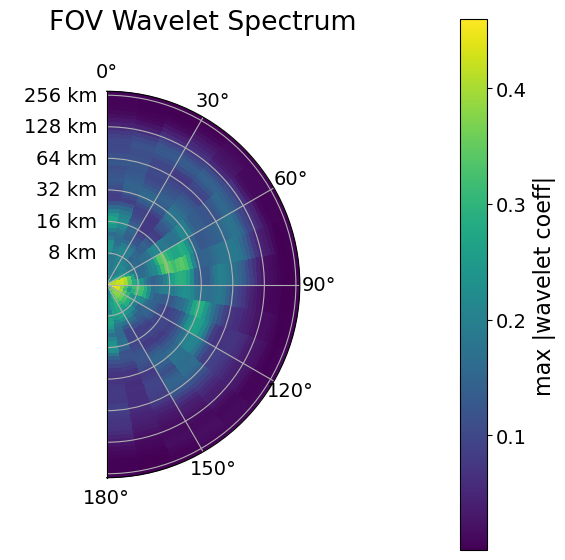

[Clusters-only] Cluster 0: amp=0.460, lamx=-27.39, lamy=4.83, lam=4.76
[Clusters-only] Cluster 1: amp=0.435, lamx=16.54, lamy=6.02, lam=5.66
[Clusters-only] Cluster 2: amp=0.357, lamx=46.78, lamy=17.03, lam=16.00
[Clusters-only] Cluster 3: amp=0.343, lamx=66.16, lamy=24.08, lam=22.63
[Clusters-only] Cluster 4: amp=0.333, lamx=130649914825562960.00, lamy=8.00, lam=8.00
[Clusters-only] Cluster 5: amp=0.298, lamx=-184.28, lamy=32.49, lam=32.00
[Clusters-only] Cluster 6: amp=0.285, lamx=49.35, lamy=28.49, lam=24.68
[Clusters-only] Cluster 7: amp=0.283, lamx=38.05, lamy=21.97, lam=19.03
[Clusters-only] Cluster 8: amp=0.272, lamx=-9.24, lamy=16.00, lam=8.00
[Overlay] Cluster 0: amp=0.460, lamx=-27.39, lamy=4.83, lam=4.76
[Overlay] Cluster 1: amp=0.435, lamx=16.54, lamy=6.02, lam=5.66
[Overlay] Cluster 2: amp=0.357, lamx=46.78, lamy=17.03, lam=16.00
[Overlay] Cluster 3: amp=0.343, lamx=66.16, lamy=24.08, lam=22.63
[Overlay] Cluster 4: amp=0.333, lamx=130649914825562960.00, lamy=8.00, lam=8.00

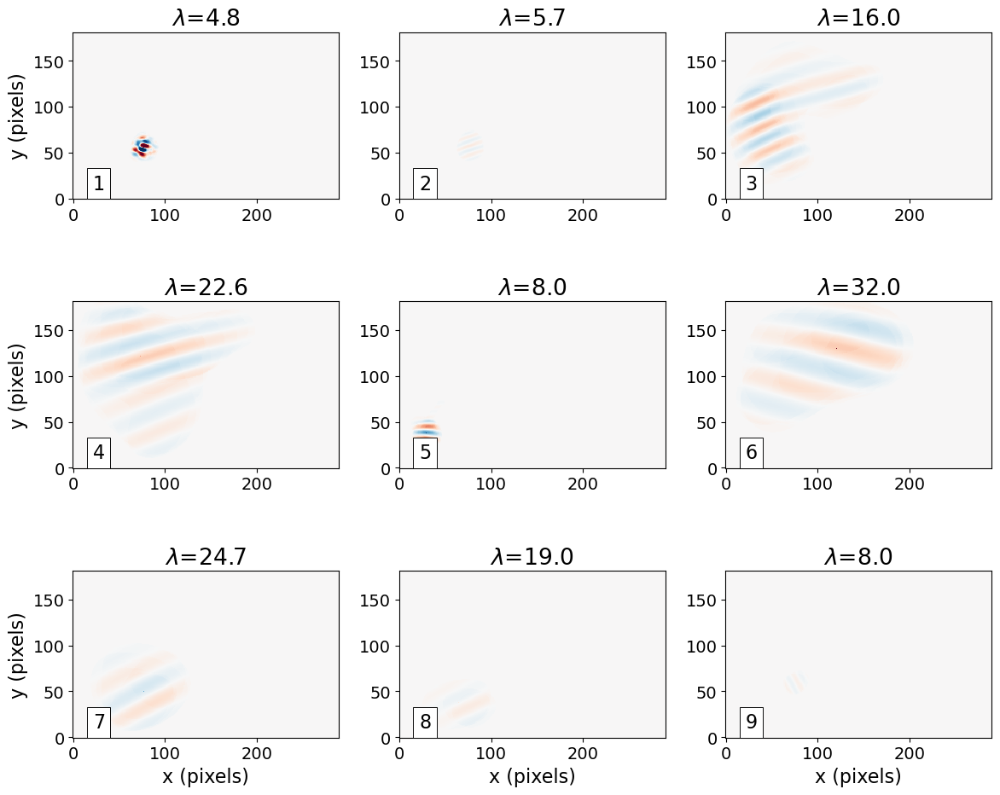

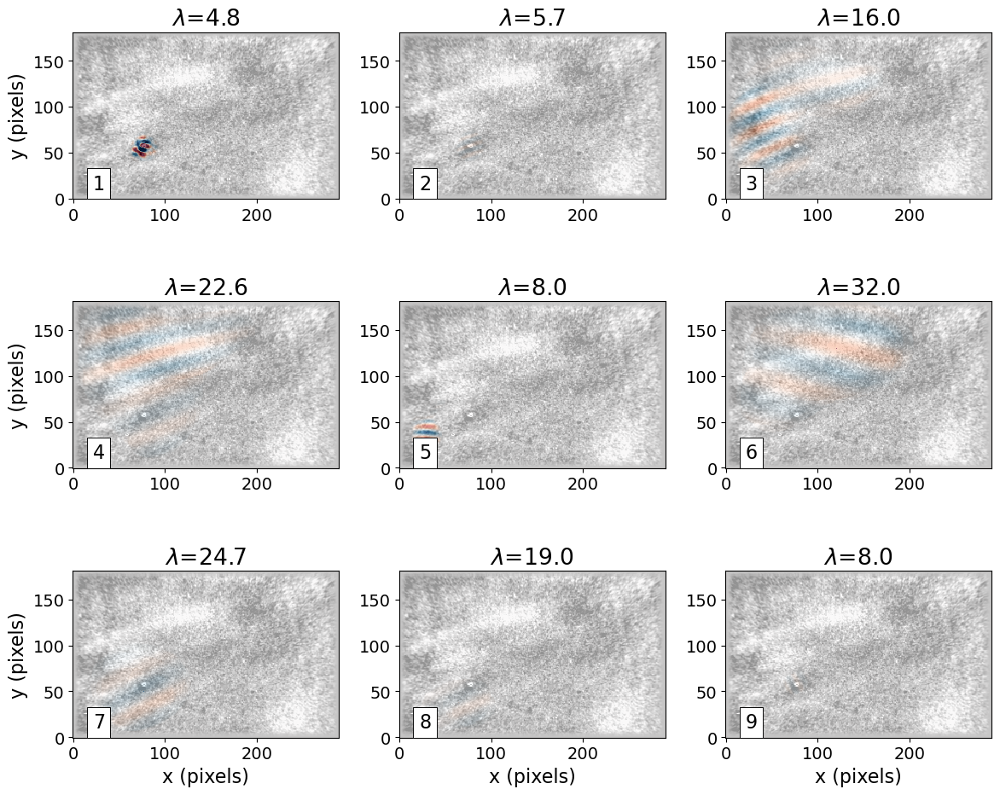

In [14]:
# Plot top 9 wavelet clusters:
#   (1) as standalone reconstructions
#   (2) overlaid on the tapered remaining field
#
# Pipeline:
#   - Load TIFF
#   - Use global mean ± 0.5 sigma as filter range
#   - Clip to ROI
#   - Background = plane + first Fourier components
#   - Remaining -> edge taper -> CWT
#   - Identify clusters
#   - Figure 1: 3x3 reconstructions (clusters only)
#   - Figure 2: 3x3 overlays (background = tapered field, overlay = cluster)

from __future__ import annotations
from typing import Tuple, Optional

import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import tifffile as tiff

from juwavelet import transform, utils, plot_utils

# --------------------------
# User params
# --------------------------
TIFF_PATH = r"C:\Users\domin\juwavelet\examples\Waves For Anh\Nov7th1150\TempOH_caun1176.tif"

# ROI (pixel slices) for wavelet etc. Set to None to use full image.
X_SLICE: Optional[slice] = slice(12, 302)
Y_SLICE: Optional[slice] = slice(18, 200)

# Single sigma factor: mean ± 0.5σ (computed once on full image)
SIGMA_FACTOR = 0.5
APPLY_RANGE_FILTER = True

# How to fill invalid pixels before CWT (to keep rectangular grid)
# choices: "median", "mean", "zero"
FILL_INVALID_FOR_CWT = "median"

# Preprocessing / background
REMOVE_TREND = True
STANDARDIZE = True
GAUSS_BLUR_SIGMA = 1    # 0 disables, else e.g. 0.8

# Edge taper on remaining field (before CWT)
APPLY_TAPER = True
TAPER_EDGE_PIXELS = 10

# Wavelet params
S0 = 4
DJ = 1/8
JS = 50
JT = 18
ASPECT = 1

# Pixel spacing (km/pixel) for CWT (wavelengths will be in km)
DX = 0.623
DY = 0.623

# --------------------------
# Plot style
# --------------------------
matplotlib.rcParams.update({
    "axes.labelsize": 16,
    "font.size": 16,
    "xtick.labelsize": 14,
    "ytick.labelsize": 14,
    "legend.fontsize": 14,
    "figure.figsize": [2 * 6.94, 2 * 4.29],
})


# --------------------------
# Helpers
# --------------------------
def load_tiff_window(
    path: str,
    xsl: Optional[slice],
    ysl: Optional[slice],
) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
    """
    Return (x_coords, y_coords, window) where window is float32 with shape (ny, nx).
    If xsl or ysl is None, the full range is used.
    """
    img = tiff.imread(path)
    if img.ndim == 3 and img.shape[-1] == 1:
        img = img[..., 0]
    if img.ndim != 2:
        raise ValueError(f"Expected single-frame 2D TIFF; got shape {img.shape}")

    Z = np.asarray(img, dtype=np.float32)

    if ysl is None:
        ysl = slice(None, None)
    if xsl is None:
        xsl = slice(None, None)
    win = Z[ysl, xsl]

    ny, nx = win.shape
    x = np.arange(nx, dtype=float)
    y = np.arange(ny, dtype=float)

    # Clean improbable NaNs/Infs
    med = float(np.median(win))
    win = np.nan_to_num(win, nan=med, posinf=med, neginf=med).astype(np.float32, copy=False)
    return x, y, win


def make_range_mask(Z: np.ndarray, lo: float, hi: float) -> np.ndarray:
    """True where value is inside [lo, hi]."""
    return (Z >= lo) & (Z <= hi)


def fit_plane(Z: np.ndarray) -> np.ndarray:
    """
    Fit a 2D plane ax + by + c to Z (least squares) and return the plane.
    """
    ny, nx = Z.shape
    yy, xx = np.mgrid[0:ny, 0:nx]
    G = np.stack([xx.ravel(), yy.ravel(), np.ones(nx * ny)], axis=1)
    coeff, *_ = np.linalg.lstsq(G, Z.ravel(), rcond=None)
    plane = (coeff[0] * xx + coeff[1] * yy + coeff[2])
    return plane


def extract_first_fourier_bg(Z: np.ndarray) -> Tuple[np.ndarray, np.ndarray]:
    """
    From a 2D field Z, keep only the first Fourier components in x and y:

      - fundamental in x: kx = ±1, ky = 0
      - fundamental in y: ky = ±1, kx = 0

    Returns (background_from_fft, residual).
    """
    ny, nx = Z.shape
    F = np.fft.fft2(Z)
    F_bg = np.zeros_like(F, dtype=complex)

    # fundamental in x (along columns, ky = 0)
    if nx > 1:
        F_bg[0, 1] = F[0, 1]
        F_bg[0, -1] = F[0, -1]

    # fundamental in y (along rows, kx = 0)
    if ny > 1:
        F_bg[1, 0] = F[1, 0]
        F_bg[-1, 0] = F[-1, 0]

    bg = np.fft.ifft2(F_bg).real
    resid = Z - bg
    return bg, resid


def maybe_blur(Z: np.ndarray, sigma: float) -> np.ndarray:
    if sigma <= 0:
        return Z
    try:
        from scipy.ndimage import gaussian_filter
    except Exception:
        return Z
    return gaussian_filter(Z, sigma=float(sigma))


def fill_invalid(Z: np.ndarray, valid_mask: np.ndarray, how: str) -> np.ndarray:
    """Fill invalid pixels to keep rectangular grid before CWT."""
    out = Z.copy()
    if valid_mask is None:
        return out
    inv = ~valid_mask
    if not np.any(inv):
        return out
    if how == "median":
        val = float(np.median(out[~inv])) if np.any(~inv) else float(np.median(out))
    elif how == "mean":
        val = float(np.mean(out[~inv])) if np.any(~inv) else float(np.mean(out))
    elif how == "zero":
        val = 0.0
    else:
        raise ValueError("FILL_INVALID_FOR_CWT must be 'median', 'mean', or 'zero'")
    out[inv] = val
    return out


def _fmt(v: float) -> str:
    if not np.isfinite(v):
        return "∞"
    v = float(v)
    if abs(v) >= 1000 or abs(v) < 0.1:
        return f"{v:.2e}"
    elif abs(v) >= 100:
        return f"{v:.0f}"
    else:
        return f"{v:.1f}"


# --------------------------
# Edge taper (Hanning near boundaries)
# --------------------------
def _hanning_edge_1d(n: int, edge: int) -> np.ndarray:
    """
    1D window that is ~0 at the very edges, ramps to 1 over `edge` pixels,
    and equals 1 in the interior. Hanning-like cosine ramp.
    """
    w = np.ones(n, dtype=float)
    if edge <= 0:
        return w
    edge = min(edge, n // 2)
    ramp = 0.5 * (1.0 - np.cos(np.linspace(0, np.pi, edge, endpoint=True)))
    w[:edge] = ramp
    w[-edge:] = ramp[::-1]
    return w


def apply_edge_hanning_taper(Z: np.ndarray, edge: int) -> np.ndarray:
    """
    Apply a separable 2D Hanning-like taper only near the edges:
      interior stays ~1
      transitions smoothly to 0 at the borders over `edge` pixels.
    """
    ny, nx = Z.shape
    if edge <= 0:
        return Z
    wx = _hanning_edge_1d(nx, edge)
    wy = _hanning_edge_1d(ny, edge)
    W = np.outer(wy, wx)   # shape (ny, nx)
    return Z * W


# --------------------------
# Pipeline
# --------------------------
def run_pipeline():
    # 1) Load full TIFF (no spatial slice here)
    x_full, y_full, full = load_tiff_window(TIFF_PATH, None, None)

    # 2) Compute mean/std once on the full image, use ±0.5σ everywhere
    sample_full = full.ravel().astype(float)
    center = float(np.mean(sample_full))
    sigma = float(np.std(sample_full))
    k = SIGMA_FACTOR
    lo = center - k * sigma
    hi = center + k * sigma

    print(f"[Full] mean: {center:.2f}")
    print(f"[Full] sigma: {sigma:.2f}")
    print(f"[Full] Dynamic range: [{lo:.2f}, {hi:.2f}] = mean ± {k:.2f}·sigma")

    # 3) Clip to ROI
    ysl = Y_SLICE if Y_SLICE is not None else slice(None, None)
    xsl = X_SLICE if X_SLICE is not None else slice(None, None)

    raw = full[ysl, xsl]
    ny, nx = raw.shape
    x1d = np.arange(nx, dtype=float)
    y1d = np.arange(ny, dtype=float)[::-1]   # flip y for display

    print(f"[ROI] shape: {raw.shape}")

    # 4) Range filter for ROI, using the SAME [lo, hi] from full image
    mask = None
    if APPLY_RANGE_FILTER:
        mask = make_range_mask(raw, lo, hi)
        vals_roi = raw[mask]
        if vals_roi.size > 0:
            print(f"[ROI] In-range count: {vals_roi.size}")
            print(f"[ROI] In-range min/max: {np.nanmin(vals_roi):.2f} / {np.nanmax(vals_roi):.2f}")
            p5r, p50r, p95r = np.nanpercentile(vals_roi, [5, 50, 95])
            print(f"[ROI] In-range percentiles 5/50/95: {p5r:.2f} / {p50r:.2f} / {p95r:.2f}")
        else:
            print("[ROI] Warning: no pixels in [mean ± 0.5σ]")

    # 5) Prepare data for CWT: fill removed pixels to keep rectangular grid
    filled = fill_invalid(raw, mask, FILL_INVALID_FOR_CWT) if APPLY_RANGE_FILTER else raw

    # 6) Background separation: plane + first Fourier
    proc0 = filled.copy()
    if REMOVE_TREND:
        plane = fit_plane(proc0)
        detrended = proc0 - plane
    else:
        plane = np.zeros_like(proc0)
        detrended = proc0

    fourier_bg, _ = extract_first_fourier_bg(detrended)
    background = plane + fourier_bg
    remaining = proc0 - background

    # 7) Apply edge taper on remaining field (for CWT and plotting)
    if APPLY_TAPER:
        remaining_tapered = apply_edge_hanning_taper(remaining, TAPER_EDGE_PIXELS)
    else:
        remaining_tapered = remaining.copy()

    # Background image for overlays: tapered remaining, centered
    bg_tapered_centered = remaining_tapered - np.median(remaining_tapered)
    bg_low, bg_high = np.nanpercentile(bg_tapered_centered, [2, 98])
    bg_vmax = max(abs(bg_low), abs(bg_high))
    if not np.isfinite(bg_vmax) or bg_vmax == 0:
        bg_vmax = 1.0
    bg_vmin = -bg_vmax

    # 8) Preprocess for CWT only (standardize + blur)
    proc = remaining_tapered.copy()
    if STANDARDIZE:
        s = np.std(proc)
        proc = proc / s if s > 0 else proc
    proc = maybe_blur(proc, GAUSS_BLUR_SIGMA)

    # juwavelet expects (nx, ny); image is (ny, nx)
    wave_xy = proc.T

    cwt = transform.decompose2d(
        wave_xy, dx=DX, dy=DY, s0=S0, dj=DJ, js=JS, jt=JT, aspect=ASPECT
    )

    # 9) Identify clusters
    amps, idxs, iwave = utils.identify_cluster2d(cwt, min_amp=0.25, thr=0.2)

    decomposition = cwt["decomposition"]
    orig = decomposition.copy()

    # 10) (Optional) FOV wavelet spectrum just to inspect
    plot_utils.plot_fov_wavelet_spectrum(cwt, stat="max")

    # --------------------------
    # Figure 1: clusters alone (like original)
    # --------------------------
    fig1, axs1 = plt.subplots(3, 3, figsize=(12, 10))
    axes1_flat = axs1.flatten()

    opts_img_cluster = {"cmap": "RdBu_r", "vmin": -0.8, "vmax": 0.8, "rasterized": True}

    n_clusters = len(amps) if amps is not None else 0

    if n_clusters == 0:
        for ax in axes1_flat:
            ax.set_title("no clusters found")
            ax.axis("off")
    else:
        order = np.argsort(amps)[::-1]
        n_show = min(9, n_clusters)
        biggest = order[:n_show]

        for ax, kcl in zip(axes1_flat, biggest):
            decomposition[:] = orig
            decomposition[iwave != kcl] = 0
            rec = transform.reconstruct2d(cwt)  # (nx, ny)

            rec_centered = rec.T - np.median(rec)

            udx = idxs[kcl]          # (s_idx, t_idx, ...)
            s_idx = int(udx[0])
            t_idx = int(udx[1])

            lamx = cwt["wavelength_x"][s_idx, t_idx]
            lamy = cwt["wavelength_y"][s_idx, t_idx]

            inv2 = 0.0
            if np.isfinite(lamx) and lamx != 0:
                inv2 += (1.0 / lamx) ** 2
            if np.isfinite(lamy) and lamy != 0:
                inv2 += (1.0 / lamy) ** 2
            lam = np.inf if inv2 == 0 else 1.0 / np.sqrt(inv2)

            ax.set_title(rf"$\lambda$={_fmt(lam)}")
            ax.pcolormesh(x1d, y1d, rec_centered, **opts_img_cluster)
            ax.set_aspect("equal", adjustable="box")

            print(
                f"[Clusters-only] Cluster {kcl}: amp={amps[kcl]:.3f}, "
                f"lamx={lamx:.2f}, lamy={lamy:.2f}, "
                f"lam={'inf' if not np.isfinite(lam) else f'{lam:.2f}'}"
            )

        # If fewer than 9 clusters, hide the remaining axes
        for ax in axes1_flat[n_show:]:
            ax.set_title("no cluster")
            ax.axis("off")

    # Axis labels (pixels)
    for ax in axs1[2, :]:
        ax.set_xlabel("x (pixels)")
    for ax in axs1[:, 0]:
        ax.set_ylabel("y (pixels)")

    # Number tags (1–9)
    number_box = {
        "boxstyle": "square",
        "lw": 0.67,
        "facecolor": "white",
        "edgecolor": "black",
    }
    for i, ax in enumerate(axes1_flat, start=1):
        ax.text(
            0.12,
            0.15,
            str(i),
            transform=ax.transAxes,
            bbox=number_box,
            va="top",
            ha="right",
        )

    fig1.tight_layout()

    # --------------------------
    # Figure 2: overlays (cluster on tapered field)
    # --------------------------
    fig2, axs2 = plt.subplots(3, 3, figsize=(12, 10))
    axes2_flat = axs2.flatten()

    if n_clusters == 0:
        for ax in axes2_flat:
            ax.set_title("no clusters found")
            ax.axis("off")
    else:
        order = np.argsort(amps)[::-1]
        n_show = min(9, n_clusters)
        biggest = order[:n_show]

        # cluster color scale
        cl_vmin, cl_vmax = -0.6, 0.6

        for ax, kcl in zip(axes2_flat, biggest):
            # Background: tapered remaining field (centered), grayscale
            ax.pcolormesh(
                x1d,
                y1d,
                bg_tapered_centered,
                shading="auto",
                cmap="gray",
                vmin=bg_vmin,
                vmax=bg_vmax,
            )

            # Reconstruct cluster again (so we don't depend on Figure 1 state)
            decomposition[:] = orig
            decomposition[iwave != kcl] = 0
            rec = transform.reconstruct2d(cwt)  # (nx, ny)
            rec_centered = rec.T - np.median(rec)

            udx = idxs[kcl]          # (s_idx, t_idx, ...)
            s_idx = int(udx[0])
            t_idx = int(udx[1])

            lamx = cwt["wavelength_x"][s_idx, t_idx]
            lamy = cwt["wavelength_y"][s_idx, t_idx]

            inv2 = 0.0
            if np.isfinite(lamx) and lamx != 0:
                inv2 += (1.0 / lamx) ** 2
            if np.isfinite(lamy) and lamy != 0:
                inv2 += (1.0 / lamy) ** 2
            lam = np.inf if inv2 == 0 else 1.0 / np.sqrt(inv2)

            # Overlay: semi-transparent cluster field
            ax.pcolormesh(
                x1d,
                y1d,
                rec_centered,
                shading="auto",
                cmap="RdBu_r",
                vmin=cl_vmin,
                vmax=cl_vmax,
                alpha=0.6,
            )

            ax.set_title(rf"$\lambda$={_fmt(lam)}")
            ax.set_aspect("equal", adjustable="box")

            print(
                f"[Overlay] Cluster {kcl}: amp={amps[kcl]:.3f}, "
                f"lamx={lamx:.2f}, lamy={lamy:.2f}, "
                f"lam={'inf' if not np.isfinite(lam) else f'{lam:.2f}'}"
            )

        # If fewer than 9 clusters, hide leftover axes
        for ax in axes2_flat[n_show:]:
            ax.set_title("no cluster")
            ax.axis("off")

    # Axis labels (pixels)
    for ax in axs2[2, :]:
        ax.set_xlabel("x (pixels)")
    for ax in axs2[:, 0]:
        ax.set_ylabel("y (pixels)")

    # Number tags (1–9) for overlays too
    for i, ax in enumerate(axes2_flat, start=1):
        ax.text(
            0.12,
            0.15,
            str(i),
            transform=ax.transAxes,
            bbox=number_box,
            va="top",
            ha="right",
        )

    fig2.tight_layout()

    # Show both figures
    plt.show(fig1)
    plt.show(fig2)


# --------------------------
# Run
# --------------------------
if __name__ == "__main__":
    run_pipeline()


[Full] mean: 21189.07
[Full] sigma: 3920.02
[Full] Dynamic range: [19229.06, 23149.08] = mean ± 0.50·sigma
[Full] In-range count: 79570
[Full] In-range min/max: 19236.00 / 23111.00
[Full] In-range percentiles 5/50/95: 20886.00 / 21577.00 / 22246.00


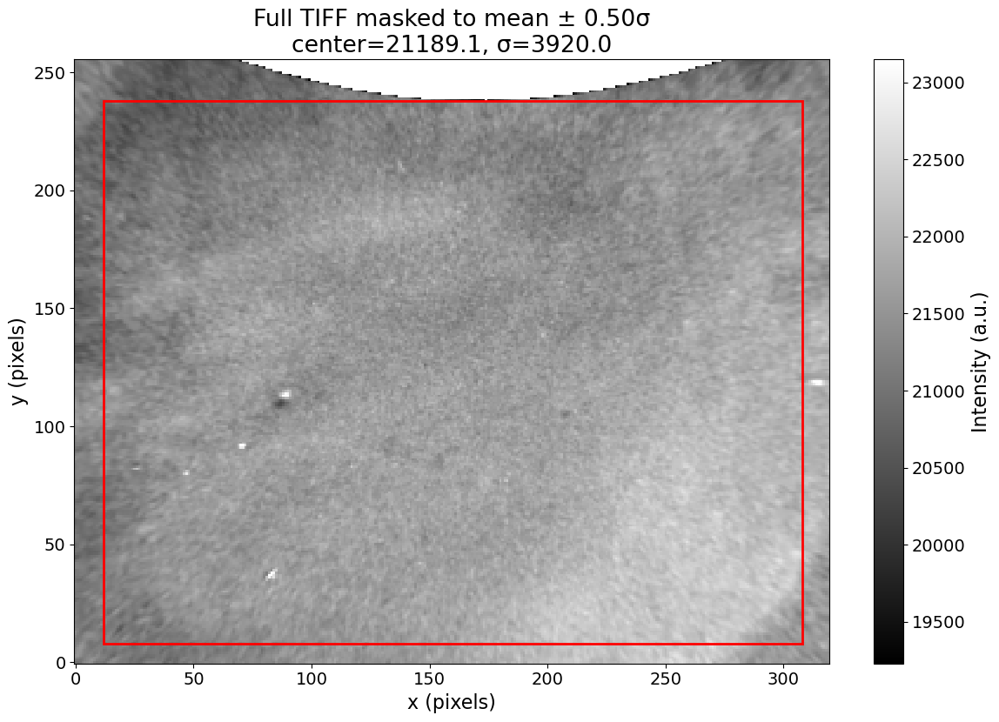

[ROI] shape: (230, 296)
[ROI] In-range count: 68073
[ROI] In-range min/max: 20272.00 / 23077.00
[ROI] In-range percentiles 5/50/95: 21031.00 / 21600.00 / 22251.00


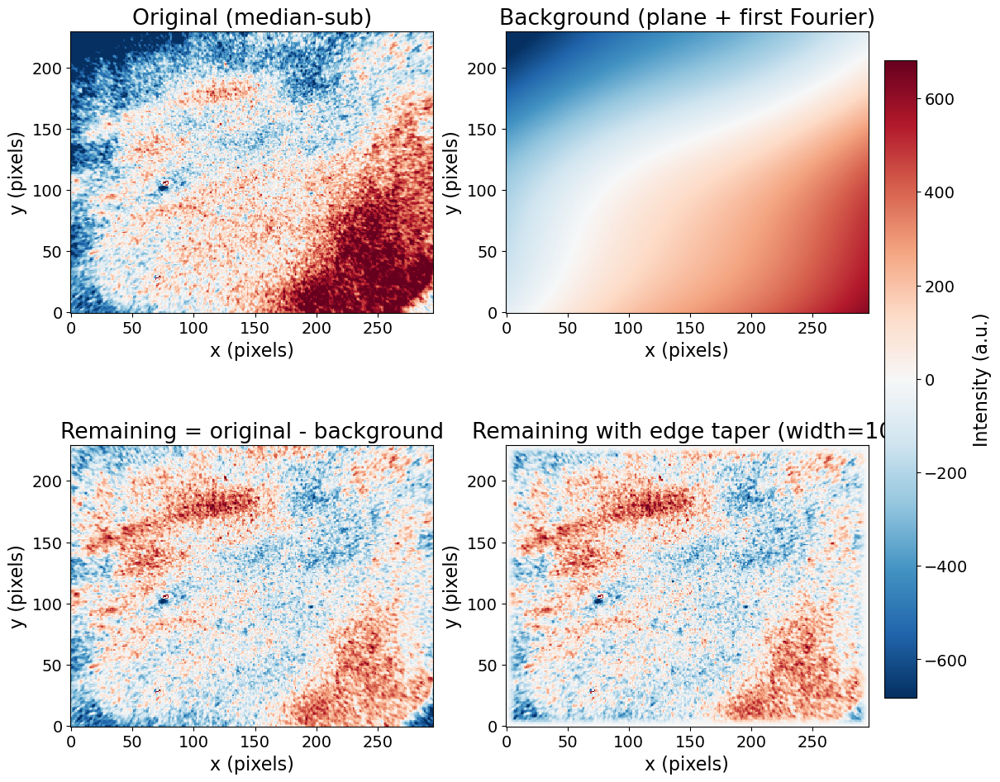

C:\Users\domin\juwavelet\juwavelet\transform.py:324: RuntimeWarning: divide by zero encountered in divide
  wys = periods[:, np.newaxis] / (aspect * np.sin(thetas[np.newaxis, :]))
C:\Users\domin\juwavelet\juwavelet\transform.py:367: RuntimeWarning: divide by zero encountered in divide
  "wavelength_y": periods[:, np.newaxis] / (aspect * np.sin(thetas[np.newaxis, :])),


------------
cluster= 0
amplitude= 0.4023271675142412 idx= (np.int64(2), np.int64(10), np.int64(76), np.int64(126))
selected elements: 19276
------------
cluster= 1
amplitude= 0.3771623841903866 idx= (np.int64(4), np.int64(7), np.int64(76), np.int64(124))
selected elements: 1740
------------
cluster= 2
amplitude= 0.3417421841420984 idx= (np.int64(8), np.int64(9), np.int64(29), np.int64(145))
selected elements: 10106
------------
cluster= 3
amplitude= 0.34070710902890317 idx= (np.int64(16), np.int64(7), np.int64(43), np.int64(94))
selected elements: 57335
------------
cluster= 4
amplitude= 0.3281213829053271 idx= (np.int64(20), np.int64(7), np.int64(74), np.int64(59))
selected elements: 84299
------------
cluster= 5
amplitude= 0.2996772821273012 idx= (np.int64(21), np.int64(6), np.int64(77), np.int64(138))
selected elements: 41451
------------
cluster= 6
amplitude= 0.2814004317173971 idx= (np.int64(24), np.int64(10), np.int64(120), np.int64(54))
selected elements: 76832
------------
clu

C:\Users\domin\juwavelet\juwavelet\utils.py:62: RuntimeWarning: divide by zero encountered in scalar divide
  hl = 1. / np.sin(theta[sel_t[j]])
100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 68.79it/s]
C:\Users\domin\juwavelet\juwavelet\utils.py:89: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


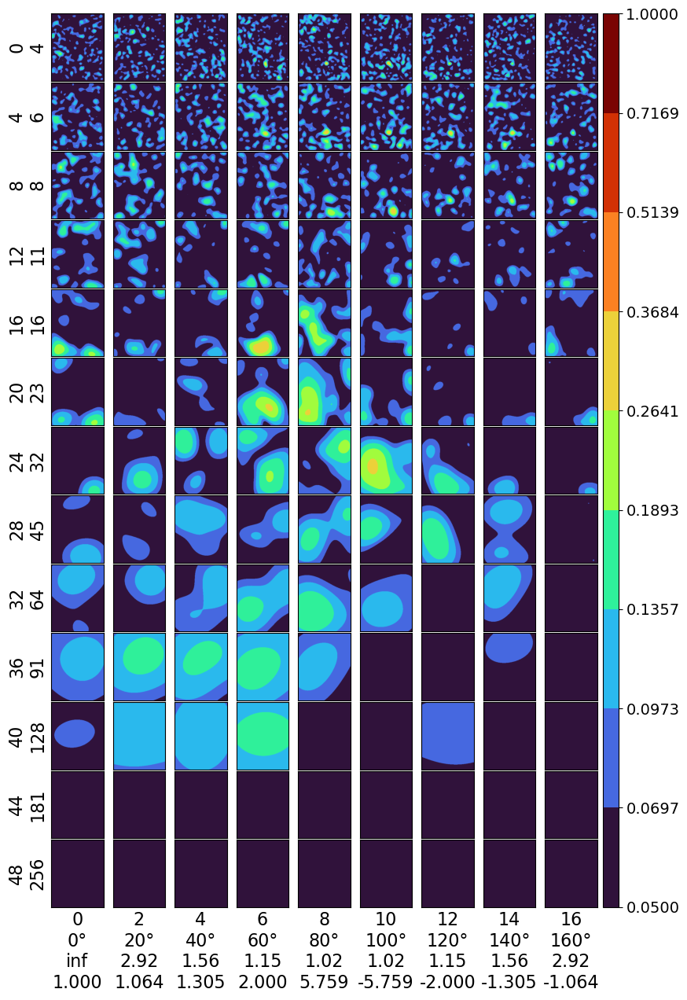

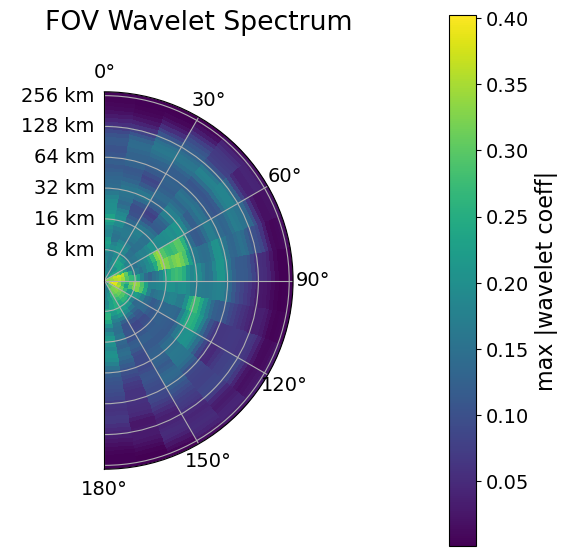

[Clusters-only] Cluster 0: amp=0.402, lamx=-27.39, lamy=4.83, lam=4.76
[Clusters-only] Cluster 1: amp=0.377, lamx=16.54, lamy=6.02, lam=5.66
[Clusters-only] Cluster 2: amp=0.342, lamx=130649914825562960.00, lamy=8.00, lam=8.00
[Clusters-only] Cluster 3: amp=0.341, lamx=46.78, lamy=17.03, lam=16.00
[Clusters-only] Cluster 4: amp=0.328, lamx=66.16, lamy=24.08, lam=22.63
[Clusters-only] Cluster 5: amp=0.300, lamx=49.35, lamy=28.49, lam=24.68
[Clusters-only] Cluster 6: amp=0.281, lamx=-184.28, lamy=32.49, lam=32.00
[Clusters-only] Cluster 7: amp=0.259, lamx=38.74, lamy=6.83, lam=6.73
[Clusters-only] Cluster 8: amp=0.259, lamx=-9.66, lamy=54.79, lam=9.51


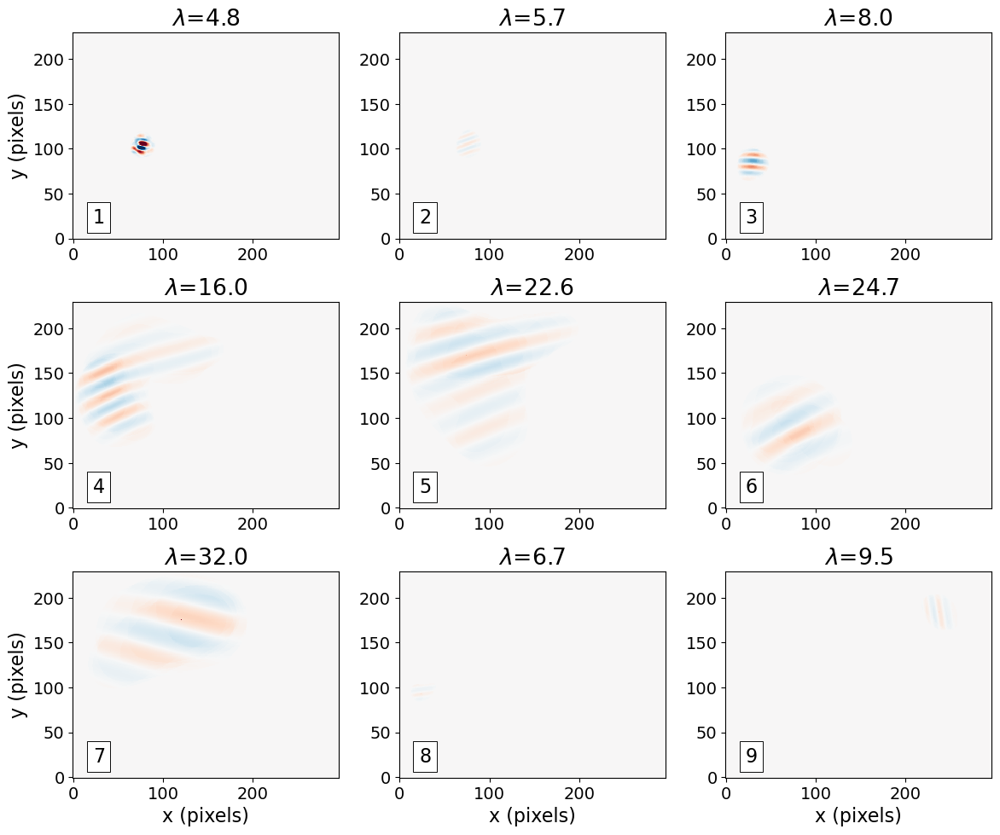

[Overlay] Cluster 0: amp=0.402, lamx=-27.39, lamy=4.83, lam=4.76
[Overlay] Cluster 1: amp=0.377, lamx=16.54, lamy=6.02, lam=5.66
[Overlay] Cluster 2: amp=0.342, lamx=130649914825562960.00, lamy=8.00, lam=8.00
[Overlay] Cluster 3: amp=0.341, lamx=46.78, lamy=17.03, lam=16.00
[Overlay] Cluster 4: amp=0.328, lamx=66.16, lamy=24.08, lam=22.63
[Overlay] Cluster 5: amp=0.300, lamx=49.35, lamy=28.49, lam=24.68
[Overlay] Cluster 6: amp=0.281, lamx=-184.28, lamy=32.49, lam=32.00
[Overlay] Cluster 7: amp=0.259, lamx=38.74, lamy=6.83, lam=6.73
[Overlay] Cluster 8: amp=0.259, lamx=-9.66, lamy=54.79, lam=9.51


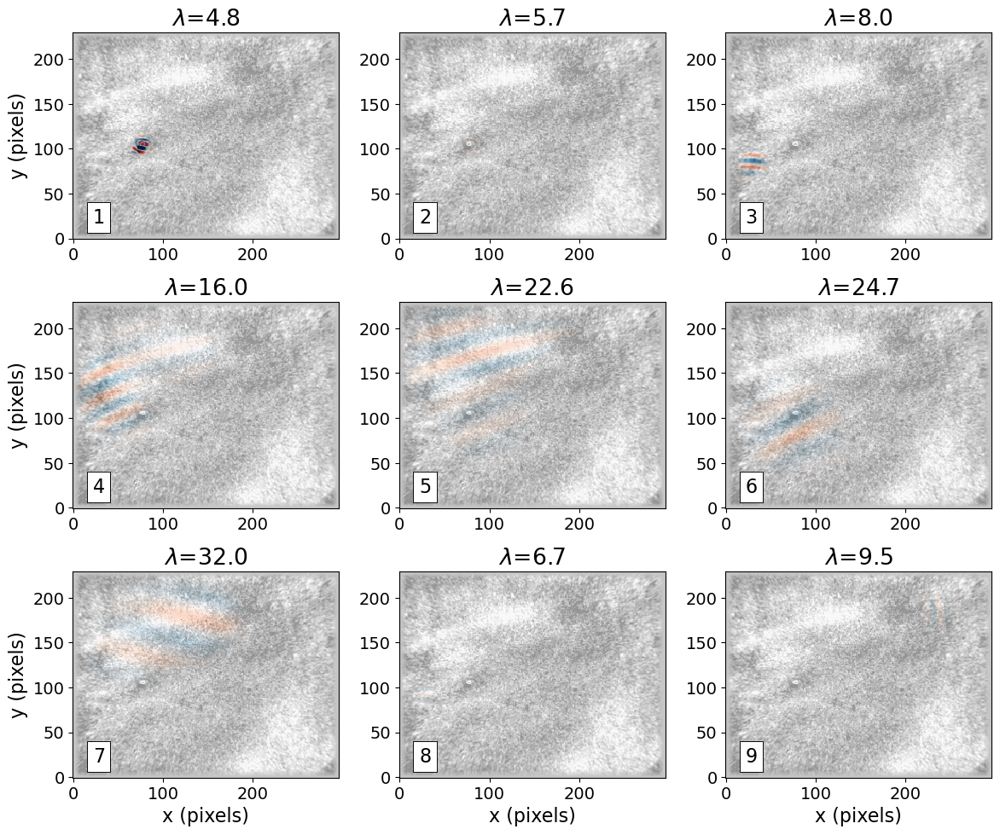

In [27]:
# Full TIFF -> ROI -> background removal -> wavelet clusters
#
# Produces:
#   1) Full TIFF preview (mean ± 0.5 sigma) with ROI rectangle
#   2) 4-panel background figure:
#        - original (median-sub)
#        - background (plane + first Fourier)
#        - remaining
#        - remaining with edge taper
#   3) Wavelet decomposition summary (utils.plot_decomposition2d)
#   4) FOV wavelet spectrum (orientation vs wavelength)
#   5) 9 standalone wavelet clusters (reconstructed fields)
#   6) 9 overlay clusters on top of the tapered remaining field

from __future__ import annotations
from typing import Tuple, Optional

import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import tifffile as tiff

from scipy.ndimage import median_filter
from juwavelet import transform, utils, plot_utils

# --------------------------
# User params
# --------------------------
TIFF_PATH = r"C:\Users\domin\juwavelet\examples\Waves For Anh\Nov7th1150\TempOH_caun1176.tif"

# ROI (pixel slices) for analysis. Set to None to use full image.
X_SLICE: Optional[slice] = slice(12, 308)
Y_SLICE: Optional[slice] = slice(18, 248)

# Single sigma factor: mean ± 0.5σ (computed once on full image)
SIGMA_FACTOR = 0.5
APPLY_RANGE_FILTER = True   # use that [lo, hi] range for ROI filtering

# How to fill invalid pixels before CWT (to keep rectangular grid)
# choices: "median", "mean", "zero"
FILL_INVALID_FOR_CWT = "median"

# Preprocessing / background
REMOVE_TREND = True         # include 2D plane in "background"
STANDARDIZE = True          # z-score like scaling before CWT
GAUSS_BLUR_SIGMA = 1        # 0 disables, else e.g. 0.8

# Edge taper on remaining field (before CWT)
APPLY_TAPER = True
TAPER_EDGE_PIXELS = 10      # width of tapered region near each edge (pixels)

# Wavelet params
S0 = 4
DJ = 1/8
JS = 50
JT = 18
ASPECT = 1

# Pixel spacing (km/pixel) for CWT (wavelengths will be in km)
DX = 0.623
DY = 0.623

# --------------------------
# Plot style
# --------------------------
matplotlib.rcParams.update({
    "axes.labelsize": 16,
    "font.size": 16,
    "xtick.labelsize": 14,
    "ytick.labelsize": 14,
    "legend.fontsize": 14,
    "figure.figsize": [2 * 6.94, 2 * 4.29],
})


# --------------------------
# Helpers
# --------------------------
def load_tiff(
    path: str,
) -> np.ndarray:
    """Load single-frame 2D TIFF as float32 array."""
    img = tiff.imread(path)
    if img.ndim == 3 and img.shape[-1] == 1:
        img = img[..., 0]
    if img.ndim != 2:
        raise ValueError(f"Expected single-frame 2D TIFF; got shape {img.shape}")
    Z = np.asarray(img, dtype=np.float32)
    med = float(np.median(Z))
    Z = np.nan_to_num(Z, nan=med, posinf=med, neginf=med).astype(np.float32, copy=False)
    return Z


def make_range_mask(Z: np.ndarray, lo: float, hi: float) -> np.ndarray:
    """True where value is inside [lo, hi]."""
    return (Z >= lo) & (Z <= hi)


def fit_plane(Z: np.ndarray) -> np.ndarray:
    """
    Fit a 2D plane ax + by + c to Z (least squares) and return the plane.
    """
    ny, nx = Z.shape
    yy, xx = np.mgrid[0:ny, 0:nx]
    G = np.stack([xx.ravel(), yy.ravel(), np.ones(nx * ny)], axis=1)
    coeff, *_ = np.linalg.lstsq(G, Z.ravel(), rcond=None)
    plane = (coeff[0] * xx + coeff[1] * yy + coeff[2])
    return plane


def extract_first_fourier_bg(Z: np.ndarray) -> Tuple[np.ndarray, np.ndarray]:
    """
    From a 2D field Z, keep only the first Fourier components in x and y:

      - fundamental in x: kx = ±1, ky = 0
      - fundamental in y: ky = ±1, kx = 0

    Returns (background_from_fft, residual).
    """
    ny, nx = Z.shape
    F = np.fft.fft2(Z)
    F_bg = np.zeros_like(F, dtype=complex)

    # fundamental in x (along columns, ky = 0)
    if nx > 1:
        F_bg[0, 1] = F[0, 1]
        F_bg[0, -1] = F[0, -1]

    # fundamental in y (along rows, kx = 0)
    if ny > 1:
        F_bg[1, 0] = F[1, 0]
        F_bg[-1, 0] = F[-1, 0]

    bg = np.fft.ifft2(F_bg).real
    resid = Z - bg
    return bg, resid


def maybe_blur(Z: np.ndarray, sigma: float) -> np.ndarray:
    if sigma <= 0:
        return Z
    try:
        from scipy.ndimage import gaussian_filter
    except Exception:
        return Z
    return gaussian_filter(Z, sigma=float(sigma))


def fill_invalid(Z: np.ndarray, valid_mask: Optional[np.ndarray], how: str) -> np.ndarray:
    """Fill invalid pixels to keep rectangular grid before CWT."""
    out = Z.copy()
    if valid_mask is None:
        return out
    inv = ~valid_mask
    if not np.any(inv):
        return out
    if how == "median":
        val = float(np.median(out[~inv])) if np.any(~inv) else float(np.median(out))
    elif how == "mean":
        val = float(np.mean(out[~inv])) if np.any(~inv) else float(np.mean(out))
    elif how == "zero":
        val = 0.0
    else:
        raise ValueError("FILL_INVALID_FOR_CWT must be 'median', 'mean', or 'zero'")
    out[inv] = val
    return out


def _fmt(v: float) -> str:
    if not np.isfinite(v):
        return "∞"
    v = float(v)
    if abs(v) >= 1000 or abs(v) < 0.1:
        return f"{v:.2e}"
    elif abs(v) >= 100:
        return f"{v:.0f}"
    else:
        return f"{v:.1f}"

def despike_local_sigma(
    Z: np.ndarray,
    size: int = 3,
    k: float = 5.0,
) -> np.ndarray:
    """
    Replace pixels that deviate too much from a local median.

    Parameters
    ----------
    Z : 2D array
    size : int
        Window size for local median (3, 5, ...)
    k : float
        Threshold in units of local MAD (~sigma). Larger = more tolerant.

    Returns
    -------
    2D array, same shape as Z
    """
    Z = np.asarray(Z, float)
    med = median_filter(Z, size=size)
    # Robust local "sigma" using MAD
    mad = median_filter(np.abs(Z - med), size=size)
    # avoid division by zero
    mad = np.where(mad == 0, np.nan, mad)

    # mask where |Z - med| > k * mad
    mask_spike = np.abs(Z - med) > k * mad

    Z_clean = Z.copy()
    Z_clean[mask_spike] = med[mask_spike]
    return Z_clean

# --------------------------
# Edge taper (Hanning near boundaries)
# --------------------------
def _hanning_edge_1d(n: int, edge: int) -> np.ndarray:
    """
    1D window that is ~0 at the very edges, ramps to 1 over `edge` pixels,
    and equals 1 in the interior. Hanning-like cosine ramp.
    """
    w = np.ones(n, dtype=float)
    if edge <= 0:
        return w
    edge = min(edge, n // 2)
    ramp = 0.5 * (1.0 - np.cos(np.linspace(0, np.pi, edge, endpoint=True)))
    w[:edge] = ramp
    w[-edge:] = ramp[::-1]
    return w


def apply_edge_hanning_taper(Z: np.ndarray, edge: int) -> np.ndarray:
    """
    Apply a separable 2D Hanning-like taper only near the edges:
      interior stays ~1
      transitions smoothly to 0 at the borders over `edge` pixels.
    """
    ny, nx = Z.shape
    if edge <= 0:
        return Z
    wx = _hanning_edge_1d(nx, edge)
    wy = _hanning_edge_1d(ny, edge)
    W = np.outer(wy, wx)   # shape (ny, nx)
    return Z * W


# --------------------------
# Main pipeline
# --------------------------
def run_pipeline():
    # 1) Load full TIFF
    full = load_tiff(TIFF_PATH)
    ny_full, nx_full = full.shape
    x_full = np.arange(nx_full, dtype=float)
    y_full = np.arange(ny_full, dtype=float)

    # 2) Compute mean/std once on the full image, use ±0.5σ everywhere
    sample_full = full.ravel().astype(float)
    center = float(np.mean(sample_full))
    sigma = float(np.std(sample_full))
    k = SIGMA_FACTOR
    lo = center - k * sigma
    hi = center + k * sigma

    print(f"[Full] mean: {center:.2f}")
    print(f"[Full] sigma: {sigma:.2f}")
    print(f"[Full] Dynamic range: [{lo:.2f}, {hi:.2f}] = mean ± {k:.2f}·sigma")

    # 3) Full-image preview with that same range, and ROI rectangle
    mask_full = make_range_mask(full, lo, hi)
    preview = full.copy().astype(float)
    preview[~mask_full] = np.nan

    vals_full = preview[np.isfinite(preview)]
    if vals_full.size > 0:
        print(f"[Full] In-range count: {vals_full.size}")
        print(f"[Full] In-range min/max: {np.nanmin(vals_full):.2f} / {np.nanmax(vals_full):.2f}")
        p5f, p50f, p95f = np.nanpercentile(vals_full, [5, 50, 95])
        print(f"[Full] In-range percentiles 5/50/95: {p5f:.2f} / {p50f:.2f} / {p95f:.2f}")
    else:
        print("[Full] Warning: no pixels within mean ± 0.5 sigma")

    disp_prev = np.clip(preview, lo, hi)

    # Flip y for display
    y_full_flip = y_full[::-1]

    fig_prev, ax_prev = plt.subplots()
    im_prev = ax_prev.pcolormesh(
        x_full,
        y_full_flip,
        disp_prev,
        shading="auto",
        cmap="gray",
        vmin=lo,
        vmax=hi,
    )
    cb_prev = fig_prev.colorbar(im_prev, ax=ax_prev, fraction=0.046, pad=0.04)
    cb_prev.set_label("Intensity (a.u.)")
    ax_prev.set_xlabel("x (pixels)")
    ax_prev.set_ylabel("y (pixels)")
    ax_prev.set_title(f"Full TIFF masked to mean ± {k:.2f}σ\ncenter={center:.1f}, σ={sigma:.1f}")
    ax_prev.set_aspect("equal", adjustable="box")

    # ROI rectangle in full-image coordinates
    ysl_full = Y_SLICE if Y_SLICE is not None else slice(0, ny_full)
    xsl_full = X_SLICE if X_SLICE is not None else slice(0, nx_full)

    x0 = 0 if xsl_full.start is None else xsl_full.start
    x1 = nx_full if xsl_full.stop is None else xsl_full.stop
    y0 = 0 if ysl_full.start is None else ysl_full.start
    y1 = ny_full if ysl_full.stop is None else ysl_full.stop

    # Map to flipped-y display coords: [y0, y1) -> [ny_full - y1, ny_full - y0)
    y0_disp = ny_full - y1
    y1_disp = ny_full - y0

    rect = patches.Rectangle(
        (x0, y0_disp),
        x1 - x0,
        y1_disp - y0_disp,
        linewidth=2,
        edgecolor="red",
        facecolor="none",
    )
    ax_prev.add_patch(rect)

    plt.tight_layout()
    plt.show(fig_prev)

    # 4) Clip to ROI
    ysl = Y_SLICE if Y_SLICE is not None else slice(None, None)
    xsl = X_SLICE if X_SLICE is not None else slice(None, None)

    raw = full[ysl, xsl]
    ny, nx = raw.shape
    x1d = np.arange(nx, dtype=float)
    y1d = np.arange(ny, dtype=float)[::-1]   # flip y for display

    print(f"[ROI] shape: {raw.shape}")

    # 5) Range filter for ROI, using the SAME [lo, hi] from full image
    mask = None
    if APPLY_RANGE_FILTER:
        mask = make_range_mask(raw, lo, hi)
        vals_roi = raw[mask]
        if vals_roi.size > 0:
            print(f"[ROI] In-range count: {vals_roi.size}")
            print(f"[ROI] In-range min/max: {np.nanmin(vals_roi):.2f} / {np.nanmax(vals_roi):.2f}")
            p5r, p50r, p95r = np.nanpercentile(vals_roi, [5, 50, 95])
            print(f"[ROI] In-range percentiles 5/50/95: {p5r:.2f} / {p50r:.2f} / {p95r:.2f}")
        else:
            print("[ROI] Warning: no pixels in [mean ± 0.5σ]")

    # 6) Prepare data for CWT: fill removed pixels to keep rectangular grid
    filled = fill_invalid(raw, mask, FILL_INVALID_FOR_CWT) if APPLY_RANGE_FILTER else raw
    
    # NEW: smooth isolated bright/dark points, but leave waves alone
    proc0 = despike_local_sigma(filled, size=5, k=5.0)

    # 7) Background separation: plane + first Fourier
    if REMOVE_TREND:
        plane = fit_plane(proc0)
        detrended = proc0 - plane
    else:
        plane = np.zeros_like(proc0)
        detrended = proc0

    fourier_bg, _ = extract_first_fourier_bg(detrended)
    background = plane + fourier_bg
    remaining = proc0 - background

    # 8) Apply edge taper on remaining field (for CWT and plotting)
    if APPLY_TAPER:
        remaining_tapered = apply_edge_hanning_taper(remaining, TAPER_EDGE_PIXELS)
    else:
        remaining_tapered = remaining.copy()

    # Centered versions for plotting
    med = np.nanmedian(proc0)
    orig_c = proc0 - med
    bg_c = background - med
    rem_c = remaining
    rem_tapered_c = remaining_tapered

    # Global color scale for 4-panel
    stacked = np.concatenate([
        orig_c.ravel(),
        bg_c.ravel(),
        rem_c.ravel(),
        rem_tapered_c.ravel(),
    ])
    p_low, p_high = np.nanpercentile(stacked, [1, 99])
    vmax = max(abs(p_low), abs(p_high))
    if vmax == 0 or not np.isfinite(vmax):
        vmax = 1.0
    vmin = -vmax

    # 9) 4-panel background figure
    fig_bg, axs_bg = plt.subplots(2, 2, figsize=(12, 10), constrained_layout=True)
    axes_bg_flat = axs_bg.flatten()

    imgs_bg = [
        (orig_c, "Original (median-sub)"),
        (bg_c, "Background (plane + first Fourier)"),
        (rem_c, "Remaining = original - background"),
        (rem_tapered_c, f"Remaining with edge taper (width={TAPER_EDGE_PIXELS})"),
    ]

    im_bg = None
    for ax, (Z, title) in zip(axes_bg_flat, imgs_bg):
        im_bg = ax.pcolormesh(
            x1d,
            y1d,
            Z,
            shading="auto",
            cmap="RdBu_r",
            vmin=vmin,
            vmax=vmax,
        )
        ax.set_title(title)
        ax.set_xlabel("x (pixels)")
        ax.set_ylabel("y (pixels)")
        ax.set_aspect("equal")

    cbar_bg = fig_bg.colorbar(im_bg, ax=axs_bg, orientation="vertical",
                              fraction=0.04, pad=0.02)
    cbar_bg.set_label("Intensity (a.u.)")

    plt.show(fig_bg)

    # 10) Preprocess for CWT only (standardize + blur)
    proc = remaining_tapered.copy()
    if STANDARDIZE:
        m_proc = np.median(proc)
        proc = proc - m_proc
        s_proc = np.std(proc)
        proc = proc / s_proc if s_proc > 0 else proc
    proc = maybe_blur(proc, GAUSS_BLUR_SIGMA)

    # juwavelet expects (nx, ny); image is (ny, nx)
    wave_xy = proc.T

    cwt = transform.decompose2d(
        wave_xy, dx=DX, dy=DY, s0=S0, dj=DJ, js=JS, jt=JT, aspect=ASPECT
    )

    # 11) Identify clusters
    amps, idxs, iwave = utils.identify_cluster2d(cwt, min_amp=0.25, thr=0.2)

    decomposition = cwt["decomposition"]
    orig_decomp = decomposition.copy()

    # 12) Overview CWT plot
    cmap_cwt = matplotlib.cm.turbo
    norm_cwt = matplotlib.colors.BoundaryNorm(
        np.exp(np.linspace(np.log(0.05), np.log(1.0), 10)), cmap_cwt.N
    )
    fig_cwt, _ = utils.plot_decomposition2d(cwt, redux_s=4, redux_t=2,
                                            cmap=cmap_cwt, norm=norm_cwt)
    plt.show(fig_cwt)

    # 13) FOV wavelet spectrum
    plot_utils.plot_fov_wavelet_spectrum(cwt, stat="max")

    # Background image for overlays: tapered remaining, centered
    bg_tapered_centered = remaining_tapered - np.median(remaining_tapered)
    bg_low, bg_high = np.nanpercentile(bg_tapered_centered, [2, 98])
    bg_vmax = max(abs(bg_low), abs(bg_high))
    if not np.isfinite(bg_vmax) or bg_vmax == 0:
        bg_vmax = 1.0
    bg_vmin = -bg_vmax

    # --------------------------
    # Figure 1: 9 standalone clusters
    # --------------------------
    fig1, axs1 = plt.subplots(3, 3, figsize=(12, 10))
    axes1_flat = axs1.flatten()

    opts_img_cluster = {"cmap": "RdBu_r", "vmin": -0.8, "vmax": 0.8, "rasterized": True}

    n_clusters = len(amps) if amps is not None else 0

    if n_clusters == 0:
        for ax in axes1_flat:
            ax.set_title("no clusters found")
            ax.axis("off")
    else:
        order = np.argsort(amps)[::-1]
        n_show = min(9, n_clusters)
        biggest = order[:n_show]

        for ax, kcl in zip(axes1_flat, biggest):
            # Reconstruct cluster
            decomposition[:] = orig_decomp
            decomposition[iwave != kcl] = 0
            rec = transform.reconstruct2d(cwt)  # (nx, ny)
            rec_centered = rec.T - np.median(rec)

            udx = idxs[kcl]          # (s_idx, t_idx, ...)
            s_idx = int(udx[0])
            t_idx = int(udx[1])

            lamx = cwt["wavelength_x"][s_idx, t_idx]
            lamy = cwt["wavelength_y"][s_idx, t_idx]

            inv2 = 0.0
            if np.isfinite(lamx) and lamx != 0:
                inv2 += (1.0 / lamx) ** 2
            if np.isfinite(lamy) and lamy != 0:
                inv2 += (1.0 / lamy) ** 2
            lam = np.inf if inv2 == 0 else 1.0 / np.sqrt(inv2)

            ax.set_title(rf"$\lambda$={_fmt(lam)}")
            ax.pcolormesh(x1d, y1d, rec_centered, **opts_img_cluster)
            ax.set_aspect("equal", adjustable="box")

            print(
                f"[Clusters-only] Cluster {kcl}: amp={amps[kcl]:.3f}, "
                f"lamx={lamx:.2f}, lamy={lamy:.2f}, "
                f"lam={'inf' if not np.isfinite(lam) else f'{lam:.2f}'}"
            )

        # Hide unused axes
        for ax in axes1_flat[n_show:]:
            ax.set_title("no cluster")
            ax.axis("off")

    for ax in axs1[2, :]:
        ax.set_xlabel("x (pixels)")
    for ax in axs1[:, 0]:
        ax.set_ylabel("y (pixels)")

    number_box = {
        "boxstyle": "square",
        "lw": 0.67,
        "facecolor": "white",
        "edgecolor": "black",
    }
    for i, ax in enumerate(axes1_flat, start=1):
        ax.text(
            0.12,
            0.15,
            str(i),
            transform=ax.transAxes,
            bbox=number_box,
            va="top",
            ha="right",
        )

    fig1.tight_layout()
    plt.show(fig1)

    # --------------------------
    # Figure 2: 9 overlays (cluster on tapered field)
    # --------------------------
    fig2, axs2 = plt.subplots(3, 3, figsize=(12, 10))
    axes2_flat = axs2.flatten()

    if n_clusters == 0:
        for ax in axes2_flat:
            ax.set_title("no clusters found")
            ax.axis("off")
    else:
        order = np.argsort(amps)[::-1]
        n_show = min(9, n_clusters)
        biggest = order[:n_show]

        cl_vmin, cl_vmax = -0.6, 0.6

        for ax, kcl in zip(axes2_flat, biggest):
            # Background: tapered remaining field (centered), grayscale
            ax.pcolormesh(
                x1d,
                y1d,
                bg_tapered_centered,
                shading="auto",
                cmap="gray",
                vmin=bg_vmin,
                vmax=bg_vmax,
            )

            # Reconstruct cluster again
            decomposition[:] = orig_decomp
            decomposition[iwave != kcl] = 0
            rec = transform.reconstruct2d(cwt)  # (nx, ny)
            rec_centered = rec.T - np.median(rec)

            udx = idxs[kcl]
            s_idx = int(udx[0])
            t_idx = int(udx[1])

            lamx = cwt["wavelength_x"][s_idx, t_idx]
            lamy = cwt["wavelength_y"][s_idx, t_idx]

            inv2 = 0.0
            if np.isfinite(lamx) and lamx != 0:
                inv2 += (1.0 / lamx) ** 2
            if np.isfinite(lamy) and lamy != 0:
                inv2 += (1.0 / lamy) ** 2
            lam = np.inf if inv2 == 0 else 1.0 / np.sqrt(inv2)

            ax.pcolormesh(
                x1d,
                y1d,
                rec_centered,
                shading="auto",
                cmap="RdBu_r",
                vmin=cl_vmin,
                vmax=cl_vmax,
                alpha=0.6,
            )

            ax.set_title(rf"$\lambda$={_fmt(lam)}")
            ax.set_aspect("equal", adjustable="box")

            print(
                f"[Overlay] Cluster {kcl}: amp={amps[kcl]:.3f}, "
                f"lamx={lamx:.2f}, lamy={lamy:.2f}, "
                f"lam={'inf' if not np.isfinite(lam) else f'{lam:.2f}'}"
            )

        # Hide unused axes
        for ax in axes2_flat[n_show:]:
            ax.set_title("no cluster")
            ax.axis("off")

    for ax in axs2[2, :]:
        ax.set_xlabel("x (pixels)")
    for ax in axs2[:, 0]:
        ax.set_ylabel("y (pixels)")

    for i, ax in enumerate(axes2_flat, start=1):
        ax.text(
            0.12,
            0.15,
            str(i),
            transform=ax.transAxes,
            bbox=number_box,
            va="top",
            ha="right",
        )

    fig2.tight_layout()
    plt.show(fig2)


# --------------------------
# Run
# --------------------------
if __name__ == "__main__":
    run_pipeline()


### Despike before CWT

[Full] mean: 21189.07
[Full] sigma: 3920.02
[Full] Dynamic range: [19229.06, 23149.08] = mean ± 0.50·sigma
[Full] In-range count: 79570
[Full] In-range min/max: 19236.00 / 23111.00
[Full] In-range percentiles 5/50/95: 20886.00 / 21577.00 / 22246.00


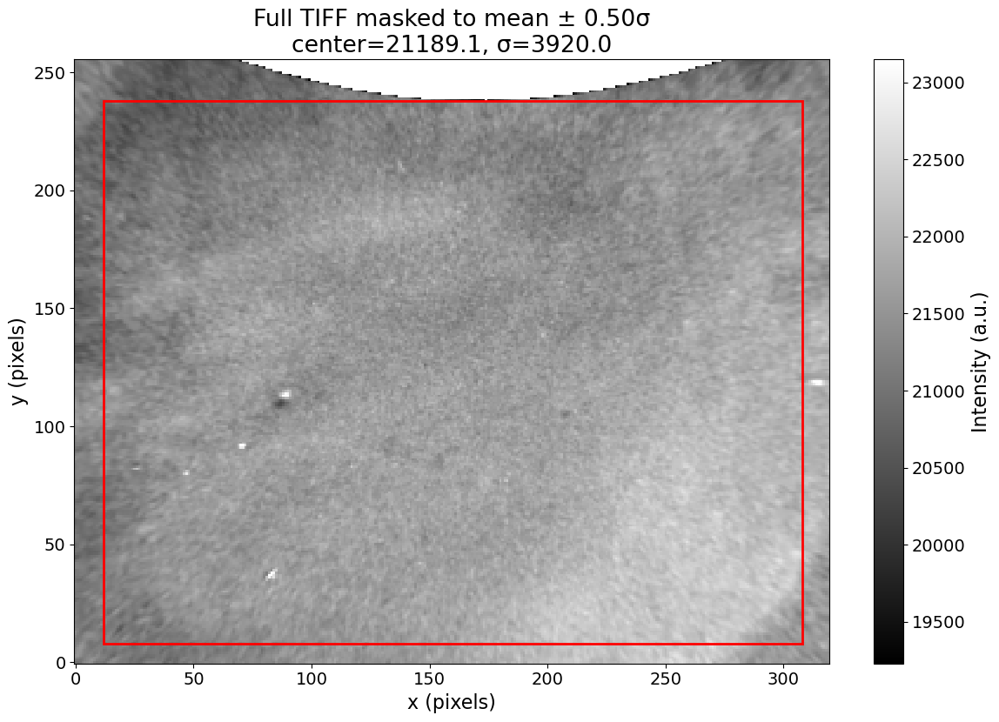

[ROI] shape: (230, 296)
[ROI] In-range count: 68073
[ROI] In-range min/max: 20272.00 / 23077.00
[ROI] In-range percentiles 5/50/95: 21031.00 / 21600.00 / 22251.00


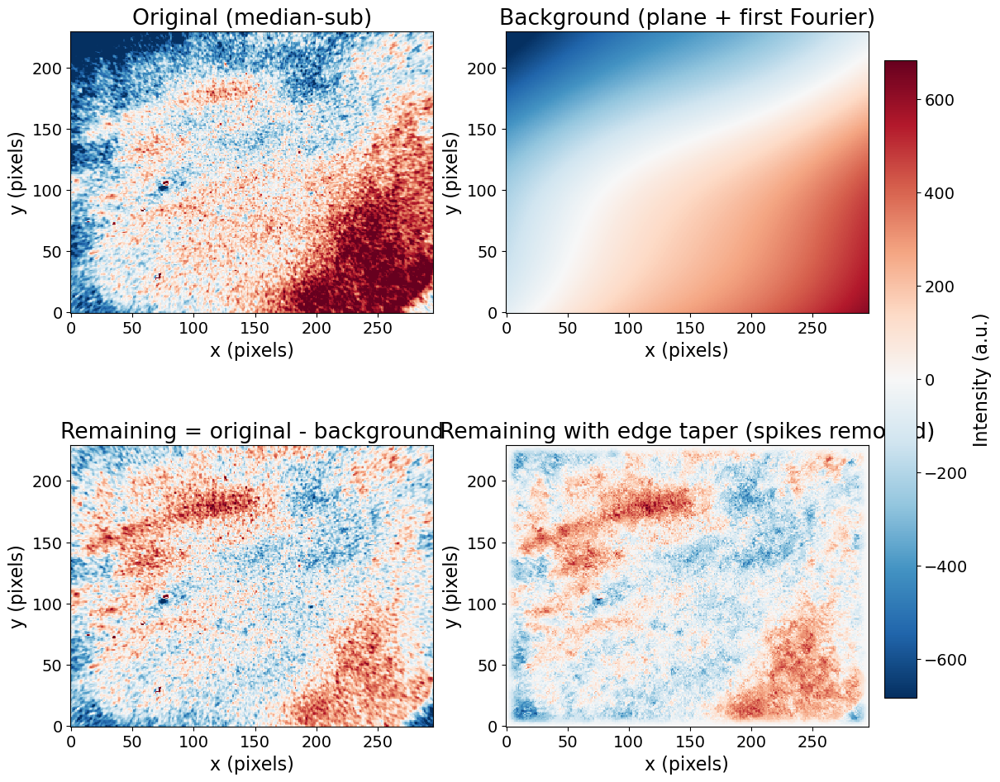

C:\Users\domin\juwavelet\juwavelet\transform.py:324: RuntimeWarning: divide by zero encountered in divide
  wys = periods[:, np.newaxis] / (aspect * np.sin(thetas[np.newaxis, :]))
C:\Users\domin\juwavelet\juwavelet\transform.py:367: RuntimeWarning: divide by zero encountered in divide
  "wavelength_y": periods[:, np.newaxis] / (aspect * np.sin(thetas[np.newaxis, :])),


------------
cluster= 0
amplitude= 0.3562400534622131 idx= (np.int64(20), np.int64(7), np.int64(77), np.int64(60))
selected elements: 143814
------------
cluster= 1
amplitude= 0.34745421946371596 idx= (np.int64(16), np.int64(6), np.int64(35), np.int64(104))
selected elements: 28678
------------
cluster= 2
amplitude= 0.33247030538265376 idx= (np.int64(21), np.int64(6), np.int64(77), np.int64(138))
selected elements: 67839
------------
cluster= 3
amplitude= 0.318527639413684 idx= (np.int64(24), np.int64(10), np.int64(123), np.int64(55))
selected elements: 147296
------------
cluster= 4
amplitude= 0.3122719397868829 idx= (np.int64(8), np.int64(9), np.int64(28), np.int64(146))
selected elements: 7358
------------
cluster= 5
amplitude= 0.2618340243565488 idx= (np.int64(10), np.int64(17), np.int64(238), np.int64(44))
selected elements: 3417
------------
cluster= 6
amplitude= 0.2565458443756531 idx= (np.int64(16), np.int64(0), np.int64(30), np.int64(36))
selected elements: 5486


C:\Users\domin\juwavelet\juwavelet\utils.py:62: RuntimeWarning: divide by zero encountered in scalar divide
  hl = 1. / np.sin(theta[sel_t[j]])
100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:00<00:00, 66.79it/s]
C:\Users\domin\juwavelet\juwavelet\utils.py:89: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


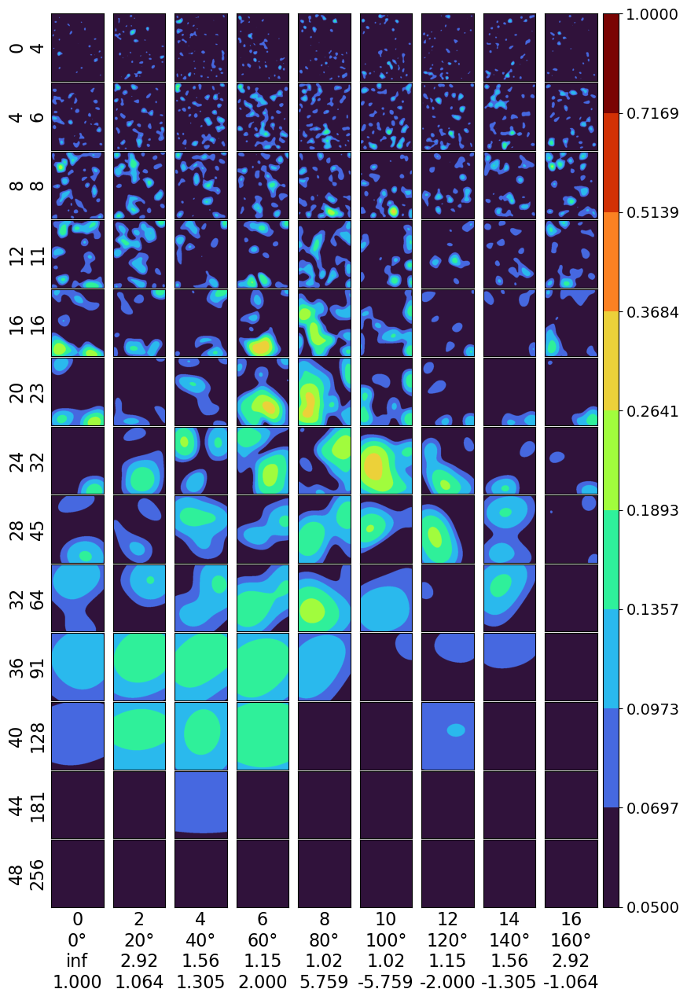

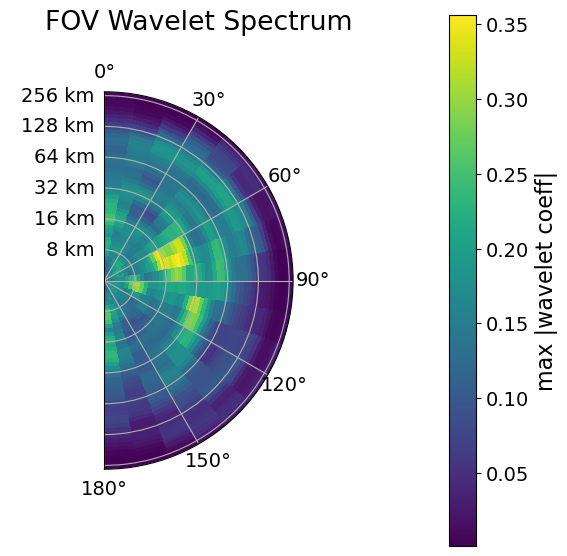

[Clusters-only] Cluster 0: amp=0.356, lamx=66.16, lamy=24.08, lam=22.63
[Clusters-only] Cluster 1: amp=0.347, lamx=32.00, lamy=18.48, lam=16.00
[Clusters-only] Cluster 2: amp=0.332, lamx=49.35, lamy=28.49, lam=24.68
[Clusters-only] Cluster 3: amp=0.319, lamx=-184.28, lamy=32.49, lam=32.00
[Clusters-only] Cluster 4: amp=0.312, lamx=130649914825562960.00, lamy=8.00, lam=8.00
[Clusters-only] Cluster 5: amp=0.262, lamx=-9.66, lamy=54.79, lam=9.51
[Clusters-only] Cluster 6: amp=0.257, lamx=16.00, lamy=inf, lam=16.00


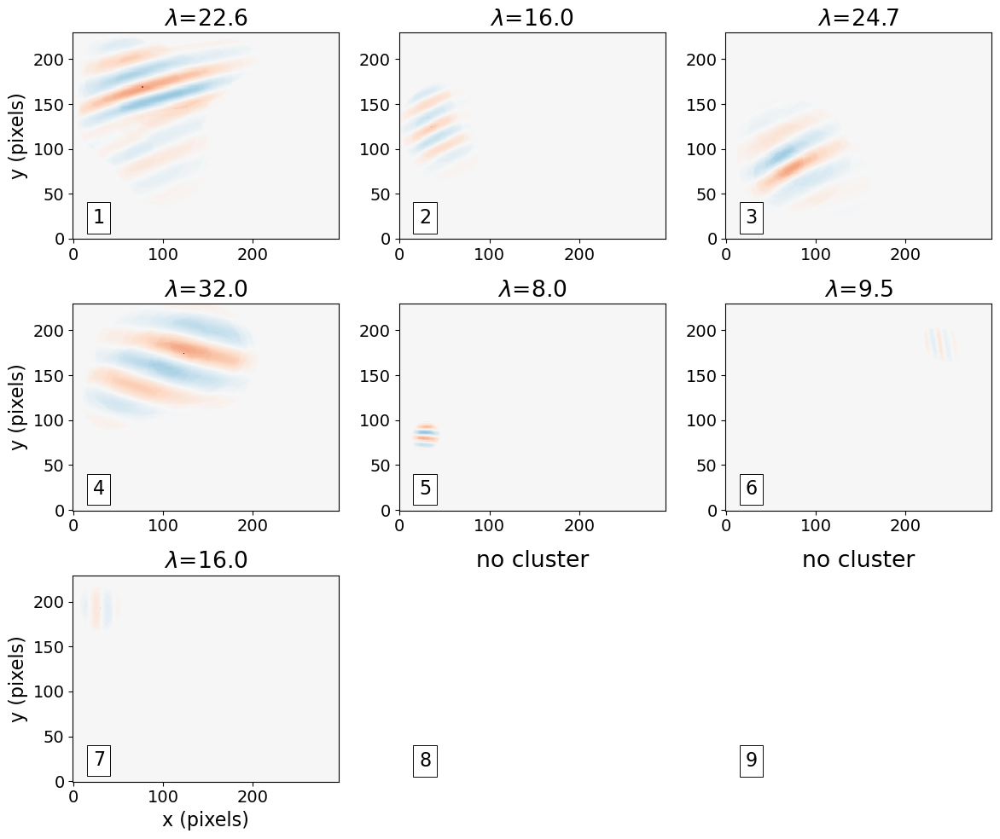

[Overlay] Cluster 0: amp=0.356, lamx=66.16, lamy=24.08, lam=22.63
[Overlay] Cluster 1: amp=0.347, lamx=32.00, lamy=18.48, lam=16.00
[Overlay] Cluster 2: amp=0.332, lamx=49.35, lamy=28.49, lam=24.68
[Overlay] Cluster 3: amp=0.319, lamx=-184.28, lamy=32.49, lam=32.00
[Overlay] Cluster 4: amp=0.312, lamx=130649914825562960.00, lamy=8.00, lam=8.00
[Overlay] Cluster 5: amp=0.262, lamx=-9.66, lamy=54.79, lam=9.51
[Overlay] Cluster 6: amp=0.257, lamx=16.00, lamy=inf, lam=16.00


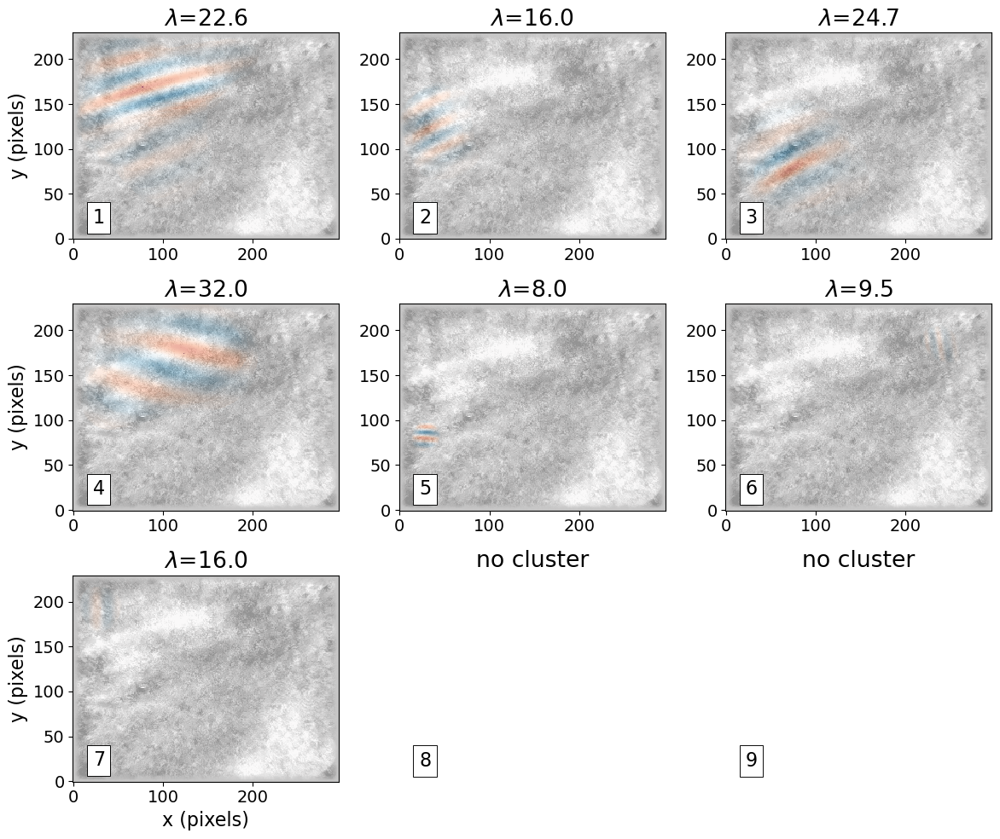

In [38]:
# Full TIFF -> ROI -> background removal -> wavelet clusters
#
# Produces:
#   1) Full TIFF preview (mean ± 0.5 sigma) with ROI rectangle
#   2) 4-panel background figure:
#        - original (median-sub)
#        - background (plane + first Fourier)
#        - remaining
#        - remaining with edge taper, spikes removed (if enabled)
#   3) Wavelet decomposition summary (utils.plot_decomposition2d)
#   4) FOV wavelet spectrum (orientation vs wavelength)
#   5) 9 standalone wavelet clusters (reconstructed fields)
#   6) 9 overlay clusters on top of the tapered remaining field (spikes removed)

from __future__ import annotations
from typing import Tuple, Optional

import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import tifffile as tiff

from scipy.ndimage import median_filter
from juwavelet import transform, utils, plot_utils

# --------------------------
# User params
# --------------------------
TIFF_PATH = r"C:\Users\domin\juwavelet\examples\Waves For Anh\Nov7th1150\TempOH_caun1176.tif"

# ROI (pixel slices) for analysis. Set to None to use full image.
X_SLICE: Optional[slice] = slice(12, 308)
Y_SLICE: Optional[slice] = slice(18, 248)

# Single sigma factor: mean ± 0.5σ (computed once on full image)
SIGMA_FACTOR = 0.5
APPLY_RANGE_FILTER = True   # use that [lo, hi] range for ROI filtering

# How to fill invalid pixels before CWT (to keep rectangular grid)
# choices: "median", "mean", "zero"
FILL_INVALID_FOR_CWT = "median"

# Preprocessing / background
REMOVE_TREND = True         # include 2D plane in "background"
STANDARDIZE = True          # z-score like scaling before CWT
GAUSS_BLUR_SIGMA = 1        # 0 disables, else e.g. 0.8

# Edge taper on remaining field (before CWT)
APPLY_TAPER = True
TAPER_EDGE_PIXELS = 10      # width of tapered region near each edge (pixels)

# Despike options (applied after tapering, before CWT)
APPLY_DESPIKE = True
DESPIKE_SIZE = 7            # median window size (odd integer)
DESPIKE_K = 2.0             # threshold in local "sigma" units

# Wavelet params
S0 = 4
DJ = 1/8
JS = 50
JT = 18
ASPECT = 1

# Pixel spacing (km/pixel) for CWT (wavelengths will be in km)
DX = 0.623
DY = 0.623

# Cluster identification parameters
CLUSTER_MIN_AMP = 0.25      # min_amp for identify_cluster2d
CLUSTER_THR = 0.2           # thr for identify_cluster2d

# --------------------------
# Plot style
# --------------------------
matplotlib.rcParams.update({
    "axes.labelsize": 16,
    "font.size": 16,
    "xtick.labelsize": 14,
    "ytick.labelsize": 14,
    "legend.fontsize": 14,
    "figure.figsize": [2 * 6.94, 2 * 4.29],
})


# --------------------------
# Helpers
# --------------------------
def load_tiff(
    path: str,
) -> np.ndarray:
    """Load single-frame 2D TIFF as float32 array."""
    img = tiff.imread(path)
    if img.ndim == 3 and img.shape[-1] == 1:
        img = img[..., 0]
    if img.ndim != 2:
        raise ValueError(f"Expected single-frame 2D TIFF; got shape {img.shape}")
    Z = np.asarray(img, dtype=np.float32)
    med = float(np.median(Z))
    Z = np.nan_to_num(Z, nan=med, posinf=med, neginf=med).astype(np.float32, copy=False)
    return Z


def make_range_mask(Z: np.ndarray, lo: float, hi: float) -> np.ndarray:
    """True where value is inside [lo, hi]."""
    return (Z >= lo) & (Z <= hi)


def fit_plane(Z: np.ndarray) -> np.ndarray:
    """
    Fit a 2D plane ax + by + c to Z (least squares) and return the plane.
    """
    ny, nx = Z.shape
    yy, xx = np.mgrid[0:ny, 0:nx]
    G = np.stack([xx.ravel(), yy.ravel(), np.ones(nx * ny)], axis=1)
    coeff, *_ = np.linalg.lstsq(G, Z.ravel(), rcond=None)
    plane = (coeff[0] * xx + coeff[1] * yy + coeff[2])
    return plane


def extract_first_fourier_bg(Z: np.ndarray) -> Tuple[np.ndarray, np.ndarray]:
    """
    From a 2D field Z, keep only the first Fourier components in x and y:

      - fundamental in x: kx = ±1, ky = 0
      - fundamental in y: ky = ±1, kx = 0

    Returns (background_from_fft, residual).
    """
    ny, nx = Z.shape
    F = np.fft.fft2(Z)
    F_bg = np.zeros_like(F, dtype=complex)

    # fundamental in x (along columns, ky = 0)
    if nx > 1:
        F_bg[0, 1] = F[0, 1]
        F_bg[0, -1] = F[0, -1]

    # fundamental in y (along rows, kx = 0)
    if ny > 1:
        F_bg[1, 0] = F[1, 0]
        F_bg[-1, 0] = F[-1, 0]

    bg = np.fft.ifft2(F_bg).real
    resid = Z - bg
    return bg, resid


def maybe_blur(Z: np.ndarray, sigma: float) -> np.ndarray:
    if sigma <= 0:
        return Z
    try:
        from scipy.ndimage import gaussian_filter
    except Exception:
        return Z
    return gaussian_filter(Z, sigma=float(sigma))


def fill_invalid(Z: np.ndarray, valid_mask: Optional[np.ndarray], how: str) -> np.ndarray:
    """Fill invalid pixels to keep rectangular grid before CWT."""
    out = Z.copy()
    if valid_mask is None:
        return out
    inv = ~valid_mask
    if not np.any(inv):
        return out
    if how == "median":
        val = float(np.median(out[~inv])) if np.any(~inv) else float(np.median(out))
    elif how == "mean":
        val = float(np.mean(out[~inv])) if np.any(~inv) else float(np.mean(out))
    elif how == "zero":
        val = 0.0
    else:
        raise ValueError("FILL_INVALID_FOR_CWT must be 'median', 'mean', or 'zero'")
    out[inv] = val
    return out


def _fmt(v: float) -> str:
    if not np.isfinite(v):
        return "∞"
    v = float(v)
    if abs(v) >= 1000 or abs(v) < 0.1:
        return f"{v:.2e}"
    elif abs(v) >= 100:
        return f"{v:.0f}"
    else:
        return f"{v:.1f}"


def despike_local_sigma(
    Z: np.ndarray,
    size: int = 3,
    k: float = 5.0,
) -> np.ndarray:
    """
    Replace pixels that deviate too much from a local median.

    Parameters
    ----------
    Z : 2D array
    size : int
        Window size for local median (3, 5, ...)
    k : float
        Threshold in units of local MAD (~sigma). Larger = more tolerant.

    Returns
    -------
    2D array, same shape as Z
    """
    Z = np.asarray(Z, float)
    med = median_filter(Z, size=size)
    mad = median_filter(np.abs(Z - med), size=size)
    mad = np.where(mad == 0, np.nan, mad)

    mask_spike = np.abs(Z - med) > k * mad

    Z_clean = Z.copy()
    Z_clean[mask_spike] = med[mask_spike]
    return Z_clean


# --------------------------
# Edge taper (Hanning near boundaries)
# --------------------------
def _hanning_edge_1d(n: int, edge: int) -> np.ndarray:
    """
    1D window that is ~0 at the very edges, ramps to 1 over `edge` pixels,
    and equals 1 in the interior. Hanning-like cosine ramp.
    """
    w = np.ones(n, dtype=float)
    if edge <= 0:
        return w
    edge = min(edge, n // 2)
    ramp = 0.5 * (1.0 - np.cos(np.linspace(0, np.pi, edge, endpoint=True)))
    w[:edge] = ramp
    w[-edge:] = ramp[::-1]
    return w


def apply_edge_hanning_taper(Z: np.ndarray, edge: int) -> np.ndarray:
    """
    Apply a separable 2D Hanning-like taper only near the edges:
      interior stays ~1
      transitions smoothly to 0 at the borders over `edge` pixels.
    """
    ny, nx = Z.shape
    if edge <= 0:
        return Z
    wx = _hanning_edge_1d(nx, edge)
    wy = _hanning_edge_1d(ny, edge)
    W = np.outer(wy, wx)   # shape (ny, nx)
    return Z * W


# --------------------------
# Main pipeline
# --------------------------
def run_pipeline():
    # 1) Load full TIFF
    full = load_tiff(TIFF_PATH)
    ny_full, nx_full = full.shape
    x_full = np.arange(nx_full, dtype=float)
    y_full = np.arange(ny_full, dtype=float)

    # 2) Compute mean/std once on the full image, use ±0.5σ everywhere
    sample_full = full.ravel().astype(float)
    center = float(np.mean(sample_full))
    sigma = float(np.std(sample_full))
    k = SIGMA_FACTOR
    lo = center - k * sigma
    hi = center + k * sigma

    print(f"[Full] mean: {center:.2f}")
    print(f"[Full] sigma: {sigma:.2f}")
    print(f"[Full] Dynamic range: [{lo:.2f}, {hi:.2f}] = mean ± {k:.2f}·sigma")

    # 3) Full-image preview with that same range, and ROI rectangle
    mask_full = make_range_mask(full, lo, hi)
    preview = full.copy().astype(float)
    preview[~mask_full] = np.nan

    vals_full = preview[np.isfinite(preview)]
    if vals_full.size > 0:
        print(f"[Full] In-range count: {vals_full.size}")
        print(f"[Full] In-range min/max: {np.nanmin(vals_full):.2f} / {np.nanmax(vals_full):.2f}")
        p5f, p50f, p95f = np.nanpercentile(vals_full, [5, 50, 95])
        print(f"[Full] In-range percentiles 5/50/95: {p5f:.2f} / {p50f:.2f} / {p95f:.2f}")
    else:
        print("[Full] Warning: no pixels within mean ± 0.5 sigma")

    disp_prev = np.clip(preview, lo, hi)

    # Flip y for display
    y_full_flip = y_full[::-1]

    fig_prev, ax_prev = plt.subplots()
    im_prev = ax_prev.pcolormesh(
        x_full,
        y_full_flip,
        disp_prev,
        shading="auto",
        cmap="gray",
        vmin=lo,
        vmax=hi,
    )
    cb_prev = fig_prev.colorbar(im_prev, ax=ax_prev, fraction=0.046, pad=0.04)
    cb_prev.set_label("Intensity (a.u.)")
    ax_prev.set_xlabel("x (pixels)")
    ax_prev.set_ylabel("y (pixels)")
    ax_prev.set_title(f"Full TIFF masked to mean ± {k:.2f}σ\ncenter={center:.1f}, σ={sigma:.1f}")
    ax_prev.set_aspect("equal", adjustable="box")

    # ROI rectangle in full-image coordinates
    ysl_full = Y_SLICE if Y_SLICE is not None else slice(0, ny_full)
    xsl_full = X_SLICE if X_SLICE is not None else slice(0, nx_full)

    x0 = 0 if xsl_full.start is None else xsl_full.start
    x1 = nx_full if xsl_full.stop is None else xsl_full.stop
    y0 = 0 if ysl_full.start is None else ysl_full.start
    y1 = ny_full if ysl_full.stop is None else ysl_full.stop

    # Map to flipped-y display coords: [y0, y1) -> [ny_full - y1, ny_full - y0)
    y0_disp = ny_full - y1
    y1_disp = ny_full - y0

    rect = patches.Rectangle(
        (x0, y0_disp),
        x1 - x0,
        y1_disp - y0_disp,
        linewidth=2,
        edgecolor="red",
        facecolor="none",
    )
    ax_prev.add_patch(rect)

    plt.tight_layout()
    plt.show(fig_prev)

    # 4) Clip to ROI
    ysl = Y_SLICE if Y_SLICE is not None else slice(None, None)
    xsl = X_SLICE if X_SLICE is not None else slice(None, None)

    raw = full[ysl, xsl]
    ny, nx = raw.shape
    x1d = np.arange(nx, dtype=float)
    y1d = np.arange(ny, dtype=float)[::-1]   # flip y for display

    print(f"[ROI] shape: {raw.shape}")

    # 5) Range filter for ROI, using the SAME [lo, hi] from full image
    mask = None
    if APPLY_RANGE_FILTER:
        mask = make_range_mask(raw, lo, hi)
        vals_roi = raw[mask]
        if vals_roi.size > 0:
            print(f"[ROI] In-range count: {vals_roi.size}")
            print(f"[ROI] In-range min/max: {np.nanmin(vals_roi):.2f} / {np.nanmax(vals_roi):.2f}")
            p5r, p50r, p95r = np.nanpercentile(vals_roi, [5, 50, 95])
            print(f"[ROI] In-range percentiles 5/50/95: {p5r:.2f} / {p50r:.2f} / {p95r:.2f}")
        else:
            print("[ROI] Warning: no pixels in [mean ± 0.5σ]")

    # 6) Prepare data for CWT: fill removed pixels to keep rectangular grid
    filled = fill_invalid(raw, mask, FILL_INVALID_FOR_CWT) if APPLY_RANGE_FILTER else raw

    # No despike here; we will despike after tapering.
    proc0 = filled.copy()

    # 7) Background separation: plane + first Fourier
    if REMOVE_TREND:
        plane = fit_plane(proc0)
        detrended = proc0 - plane
    else:
        plane = np.zeros_like(proc0)
        detrended = proc0

    fourier_bg, _ = extract_first_fourier_bg(detrended)
    background = plane + fourier_bg
    remaining = proc0 - background

    # 8) Apply edge taper on remaining field (for CWT and plotting)
    if APPLY_TAPER:
        remaining_tapered = apply_edge_hanning_taper(remaining, TAPER_EDGE_PIXELS)
    else:
        remaining_tapered = remaining.copy()

    # Remove spikes AFTER tapering (optional)
    if APPLY_DESPIKE:
        remaining_tapered_clean = despike_local_sigma(
            remaining_tapered, size=DESPIKE_SIZE, k=DESPIKE_K
        )
    else:
        remaining_tapered_clean = remaining_tapered

    # Centered versions for plotting
    med = np.nanmedian(proc0)
    orig_c = proc0 - med
    bg_c = background - med
    rem_c = remaining
    rem_tapered_c = remaining_tapered_clean

    # Global color scale for 4-panel
    stacked = np.concatenate([
        orig_c.ravel(),
        bg_c.ravel(),
        rem_c.ravel(),
        rem_tapered_c.ravel(),
    ])
    p_low, p_high = np.nanpercentile(stacked, [1, 99])
    vmax = max(abs(p_low), abs(p_high))
    if vmax == 0 or not np.isfinite(vmax):
        vmax = 1.0
    vmin = -vmax

    # 9) 4-panel background figure
    fig_bg, axs_bg = plt.subplots(2, 2, figsize=(12, 10), constrained_layout=True)
    axes_bg_flat = axs_bg.flatten()

    imgs_bg = [
        (orig_c, "Original (median-sub)"),
        (bg_c, "Background (plane + first Fourier)"),
        (rem_c, "Remaining = original - background"),
        (rem_tapered_c, f"Remaining with edge taper (spikes removed)"),
    ]

    im_bg = None
    for ax, (Z, title) in zip(axes_bg_flat, imgs_bg):
        im_bg = ax.pcolormesh(
            x1d,
            y1d,
            Z,
            shading="auto",
            cmap="RdBu_r",
            vmin=vmin,
            vmax=vmax,
        )
        ax.set_title(title)
        ax.set_xlabel("x (pixels)")
        ax.set_ylabel("y (pixels)")
        ax.set_aspect("equal")

    cbar_bg = fig_bg.colorbar(im_bg, ax=axs_bg, orientation="vertical",
                              fraction=0.04, pad=0.02)
    cbar_bg.set_label("Intensity (a.u.)")

    plt.show(fig_bg)

    # 10) Preprocess for CWT only (standardize + blur) on tapered + de-spiked field
    proc = remaining_tapered_clean.copy()
    if STANDARDIZE:
        m_proc = np.median(proc)
        proc = proc - m_proc
        s_proc = np.std(proc)
        proc = proc / s_proc if s_proc > 0 else proc
    proc = maybe_blur(proc, GAUSS_BLUR_SIGMA)

    # juwavelet expects (nx, ny); image is (ny, nx)
    wave_xy = proc.T

    cwt = transform.decompose2d(
        wave_xy, dx=DX, dy=DY, s0=S0, dj=DJ, js=JS, jt=JT, aspect=ASPECT
    )

    # 11) Identify clusters
    amps, idxs, iwave = utils.identify_cluster2d(
        cwt, min_amp=CLUSTER_MIN_AMP, thr=CLUSTER_THR
    )

    decomposition = cwt["decomposition"]
    orig_decomp = decomposition.copy()

    # 12) Overview CWT plot
    cmap_cwt = matplotlib.cm.turbo
    norm_cwt = matplotlib.colors.BoundaryNorm(
        np.exp(np.linspace(np.log(0.05), np.log(1.0), 10)), cmap_cwt.N
    )
    fig_cwt, _ = utils.plot_decomposition2d(cwt, redux_s=4, redux_t=2,
                                            cmap=cmap_cwt, norm=norm_cwt)
    plt.show(fig_cwt)

    # 13) FOV wavelet spectrum
    plot_utils.plot_fov_wavelet_spectrum(cwt, stat="max")

    # Background image for overlays: tapered remaining (spikes removed), centered
    bg_tapered_centered = remaining_tapered_clean - np.median(remaining_tapered_clean)
    bg_low, bg_high = np.nanpercentile(bg_tapered_centered, [2, 98])
    bg_vmax = max(abs(bg_low), abs(bg_high))
    if not np.isfinite(bg_vmax) or bg_vmax == 0:
        bg_vmax = 1.0
    bg_vmin = -bg_vmax

    # --------------------------
    # Figure 1: 9 standalone clusters
    # --------------------------
    fig1, axs1 = plt.subplots(3, 3, figsize=(12, 10))
    axes1_flat = axs1.flatten()

    opts_img_cluster = {"cmap": "RdBu_r", "vmin": -0.8, "vmax": 0.8, "rasterized": True}

    n_clusters = len(amps) if amps is not None else 0

    if n_clusters == 0:
        for ax in axes1_flat:
            ax.set_title("no clusters found")
            ax.axis("off")
    else:
        order = np.argsort(amps)[::-1]
        n_show = min(9, n_clusters)
        biggest = order[:n_show]

        for ax, kcl in zip(axes1_flat, biggest):
            # Reconstruct cluster
            decomposition[:] = orig_decomp
            decomposition[iwave != kcl] = 0
            rec = transform.reconstruct2d(cwt)  # (nx, ny)
            rec_centered = rec.T - np.median(rec)

            udx = idxs[kcl]          # (s_idx, t_idx, ...)
            s_idx = int(udx[0])
            t_idx = int(udx[1])

            lamx = cwt["wavelength_x"][s_idx, t_idx]
            lamy = cwt["wavelength_y"][s_idx, t_idx]

            inv2 = 0.0
            if np.isfinite(lamx) and lamx != 0:
                inv2 += (1.0 / lamx) ** 2
            if np.isfinite(lamy) and lamy != 0:
                inv2 += (1.0 / lamy) ** 2
            lam = np.inf if inv2 == 0 else 1.0 / np.sqrt(inv2)

            ax.set_title(rf"$\lambda$={_fmt(lam)}")
            ax.pcolormesh(x1d, y1d, rec_centered, **opts_img_cluster)
            ax.set_aspect("equal", adjustable="box")

            print(
                f"[Clusters-only] Cluster {kcl}: amp={amps[kcl]:.3f}, "
                f"lamx={lamx:.2f}, lamy={lamy:.2f}, "
                f"lam={'inf' if not np.isfinite(lam) else f'{lam:.2f}'}"
            )

        # Hide unused axes
        for ax in axes1_flat[n_show:]:
            ax.set_title("no cluster")
            ax.axis("off")

    for ax in axs1[2, :]:
        ax.set_xlabel("x (pixels)")
    for ax in axs1[:, 0]:
        ax.set_ylabel("y (pixels)")

    number_box = {
        "boxstyle": "square",
        "lw": 0.67,
        "facecolor": "white",
        "edgecolor": "black",
    }
    for i, ax in enumerate(axes1_flat, start=1):
        ax.text(
            0.12,
            0.15,
            str(i),
            transform=ax.transAxes,
            bbox=number_box,
            va="top",
            ha="right",
        )

    fig1.tight_layout()
    plt.show(fig1)

    # --------------------------
    # Figure 2: 9 overlays (cluster on tapered field)
    # --------------------------
    fig2, axs2 = plt.subplots(3, 3, figsize=(12, 10))
    axes2_flat = axs2.flatten()

    if n_clusters == 0:
        for ax in axes2_flat:
            ax.set_title("no clusters found")
            ax.axis("off")
    else:
        order = np.argsort(amps)[::-1]
        n_show = min(9, n_clusters)
        biggest = order[:n_show]

        cl_vmin, cl_vmax = -0.6, 0.6

        for ax, kcl in zip(axes2_flat, biggest):
            # Background: tapered remaining field (centered, spikes removed), grayscale
            ax.pcolormesh(
                x1d,
                y1d,
                bg_tapered_centered,
                shading="auto",
                cmap="gray",
                vmin=bg_vmin,
                vmax=bg_vmax,
            )

            # Reconstruct cluster again
            decomposition[:] = orig_decomp
            decomposition[iwave != kcl] = 0
            rec = transform.reconstruct2d(cwt)  # (nx, ny)
            rec_centered = rec.T - np.median(rec)

            udx = idxs[kcl]
            s_idx = int(udx[0])
            t_idx = int(udx[1])

            lamx = cwt["wavelength_x"][s_idx, t_idx]
            lamy = cwt["wavelength_y"][s_idx, t_idx]

            inv2 = 0.0
            if np.isfinite(lamx) and lamx != 0:
                inv2 += (1.0 / lamx) ** 2
            if np.isfinite(lamy) and lamy != 0:
                inv2 += (1.0 / lamy) ** 2
            lam = np.inf if inv2 == 0 else 1.0 / np.sqrt(inv2)

            ax.pcolormesh(
                x1d,
                y1d,
                rec_centered,
                shading="auto",
                cmap="RdBu_r",
                vmin=cl_vmin,
                vmax=cl_vmax,
                alpha=0.6,
            )

            ax.set_title(rf"$\lambda$={_fmt(lam)}")
            ax.set_aspect("equal", adjustable="box")

            print(
                f"[Overlay] Cluster {kcl}: amp={amps[kcl]:.3f}, "
                f"lamx={lamx:.2f}, lamy={lamy:.2f}, "
                f"lam={'inf' if not np.isfinite(lam) else f'{lam:.2f}'}"
            )

        # Hide unused axes
        for ax in axes2_flat[n_show:]:
            ax.set_title("no cluster")
            ax.axis("off")

    for ax in axs2[2, :]:
        ax.set_xlabel("x (pixels)")
    for ax in axs2[:, 0]:
        ax.set_ylabel("y (pixels)")

    for i, ax in enumerate(axes2_flat, start=1):
        ax.text(
            0.12,
            0.15,
            str(i),
            transform=ax.transAxes,
            bbox=number_box,
            va="top",
            ha="right",
        )

    fig2.tight_layout()
    plt.show(fig2)


# --------------------------
# Run
# --------------------------
if __name__ == "__main__":
    run_pipeline()
